In [1]:

%pprint
%matplotlib inline

Pretty printing has been turned OFF


In [2]:

import sys

# Insert at 1, 0 is the script path (or '' in REPL)
sys.path.insert(1, osp.join('..', 'py'))

from spiral_utils import StraussHoweUtilities
from storage import Storage
import pandas as pd

s = Storage()
shu = StraussHoweUtilities(s=s)

In [3]:

import os.path as osp
shared_folder = osp.abspath(osp.join('..', 'share')); assert osp.exists(shared_folder)
import sys
if shared_folder not in sys.path: sys.path.insert(1, shared_folder)
from notebook_utils import NotebookUtilities
nu = NotebookUtilities(
    data_folder_path=osp.abspath(osp.join(
        '..', 'data'
    )),
    saves_folder_path=osp.abspath(osp.join(
        '..', 'saves'
    ))
)

In [4]:

from itertools import combinations
from math import cos, sin, pi, sqrt, atan
from matplotlib_inline.backend_inline import set_matplotlib_formats
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import matplotlib_inline
import numpy as np

set_matplotlib_formats('retina')
%who

Axes3D	 DBSCAN	 NotebookUtilities	 PCA	 Storage	 StraussHoweUtilities	 atan	 combinations	 cos	 
matplotlib_inline	 mcolors	 np	 nu	 osp	 pd	 pi	 plt	 s	 
set_matplotlib_formats	 shu	 sin	 sqrt	 sys	 


In [5]:

from spiral_utils import webcolors

print([f'webcolors.{fn}' for fn in dir(webcolors) if any(map(lambda x: x in fn.lower(), ['rgb', 'hex']))])

['webcolors.CSS21_HEX_TO_NAMES', 'webcolors.CSS21_NAMES_TO_HEX', 'webcolors.CSS2_HEX_TO_NAMES', 'webcolors.CSS2_NAMES_TO_HEX', 'webcolors.CSS3_HEX_TO_NAMES', 'webcolors.CSS3_NAMES_TO_HEX', 'webcolors.HTML4_HEX_TO_NAMES', 'webcolors.HTML4_NAMES_TO_HEX', 'webcolors.IntegerRGB', 'webcolors.PercentRGB', 'webcolors.hex_to_name', 'webcolors.hex_to_rgb', 'webcolors.hex_to_rgb_percent', 'webcolors.name_to_hex', 'webcolors.name_to_rgb', 'webcolors.name_to_rgb_percent', 'webcolors.normalize_hex', 'webcolors.rgb_percent_to_hex', 'webcolors.rgb_percent_to_name', 'webcolors.rgb_percent_to_rgb', 'webcolors.rgb_to_hex', 'webcolors.rgb_to_name', 'webcolors.rgb_to_rgb_percent']


In [6]:

webcolors.name_to_hex('white'), webcolors.name_to_hex('black'), tuple(webcolors.hex_to_rgb('#f9f9f9'))

('#ffffff', '#000000', (249, 249, 249))

In [7]:

backround_hex_str = '#45085b'
rbg_tuple = tuple(webcolors.hex_to_rgb(backround_hex_str))
print(rbg_tuple)
text_color = sorted([(eval(f'shu.distance_from_{color}(rbg_tuple)'), color) for color in ['white', 'black']], key=lambda x: x[0])[-1][1]
print(text_color)

(69, 8, 91)
black


In [8]:

webcolors.hex_to_rgb('#000000'), webcolors.hex_to_rgb('#ffffff')

(IntegerRGB(red=0, green=0, blue=0), IntegerRGB(red=255, green=255, blue=255))

In [9]:

print([f'shu.{fn}' for fn in dir(shu) if not fn.startswith('_')])

['shu.add_dalle_background', 'shu.add_elliptical_patriarch_label', 'shu.add_elliptical_spiral_labels', 'shu.add_elliptical_theta_labels', 'shu.add_fashion_image', 'shu.add_fashion_saeculum_image', 'shu.add_patriarch_label', 'shu.add_saeculum_image', 'shu.add_spiral_labels', 'shu.add_theta_labels', 'shu.adjust_axis', 'shu.archetypes_df', 'shu.archimedes_spiral', 'shu.bare_movie_folder', 'shu.bernoulli_spiral', 'shu.black_tuple', 'shu.colors_dict_to_dataframe', 'shu.conjunctify_nouns', 'shu.convert_age_to_y', 'shu.convert_years_to_x', 'shu.create_elliptical_xy_list', 'shu.create_xy_list', 'shu.display_test_colors', 'shu.distance_between', 'shu.distance_from_black', 'shu.distance_from_blue', 'shu.distance_from_cyan', 'shu.distance_from_green', 'shu.distance_from_kbcg_face', 'shu.distance_from_krmb_face', 'shu.distance_from_kryg_face', 'shu.distance_from_magenta', 'shu.distance_from_red', 'shu.distance_from_wcbm_face', 'shu.distance_from_wcgy_face', 'shu.distance_from_white', 'shu.distance

In [10]:

shu.patriline_df.sample(5).T

patriarch_name,"Joseph Robert Babbitt, Sr.",Thomas Bobbet,David Babbitt,"(No Name), Jr.","Elkanah Babbitt, II"
year_of_birth,1891,1584,1766,1550,1690
year_of_death,1968.0,1636.0,1816.0,1624.0,1754.0
generation_name,Lost,Parliamentary,Republican,Elizabethan,Enlightenment
date_of_birth,"May 04, 1891","October 25, 1584",1766,1550,"April 22, 1690"
place_of_birth,"Flagstaff, Coconino, AZ, United States","Coney Weston, Suffolk, England, United Kingdom","Lanesborough, Berkshire, MA, United States",Unknown Place of Birth,"Berkley, Bristol County, New Plymouth Colony"
birth_longitude,35.181273,52.3603,42.536983,NaN,41.75582
birth_latitude,-111.642978,0.87089,-73.273946,NaN,-70.806832
date_of_death,"March 19, 1968 (76)",1636 (51),"September 08, 1816 (50)","April 01, 1624 (74)","April 01, 1754 (63)"
place_of_death,"Flagstaff, Coconino, AZ, U","Norfolk, England, United Kingdom","Lanesborough, Berkshire, MA",Unknown Place of Death,"Berkley, Bristol County, Province of Massachsutts"
death_longitude,35.181273,52.674122,42.536983,NaN,41.825963



# XKCD

In [11]:

colors_dict = {name: mcolors.to_rgb(color) for name, color in mcolors.XKCD_COLORS.items()}
xkcd_colors_df = shu.colors_dict_to_dataframe(colors_dict)
xkcd_colors_df.sample(5).T

,xkcd:dark royal blue,xkcd:evergreen,xkcd:marine,xkcd:blue grey,xkcd:purpleish
Red,0.007843,0.019608,0.015686,0.376471,0.596078
Green,0.023529,0.278431,0.180392,0.486275,0.337255
Blue,0.435294,0.164706,0.376471,0.556863,0.552941


In [12]:

if 'xkcd_color' not in shu.patriline_df:
    columns_list = ['saeculum_name', 'generation_name', 'xkcd_color']
    previous_saeculum_name = ''
    print("#shu.patriline_df['xkcd_color'] = np.nan")
    for patriarch_name, row_series in shu.patriline_df[columns_list].iterrows():
        saeculum_name = row_series['saeculum_name']
        generation_name = row_series['generation_name']
        xkcd_color = row_series['xkcd_color']
        if saeculum_name != previous_saeculum_name:
            previous_saeculum_name = saeculum_name
            print()
            print(f'# {saeculum_name}')
        print(f"mask_series = (shu.patriline_df.index == '{patriarch_name}')")
        print(f"shu.patriline_df.loc[mask_series, 'xkcd_color'] = '{xkcd_color}'")
    print()
    print('store_objects(patriline_df=shu.patriline_df)')

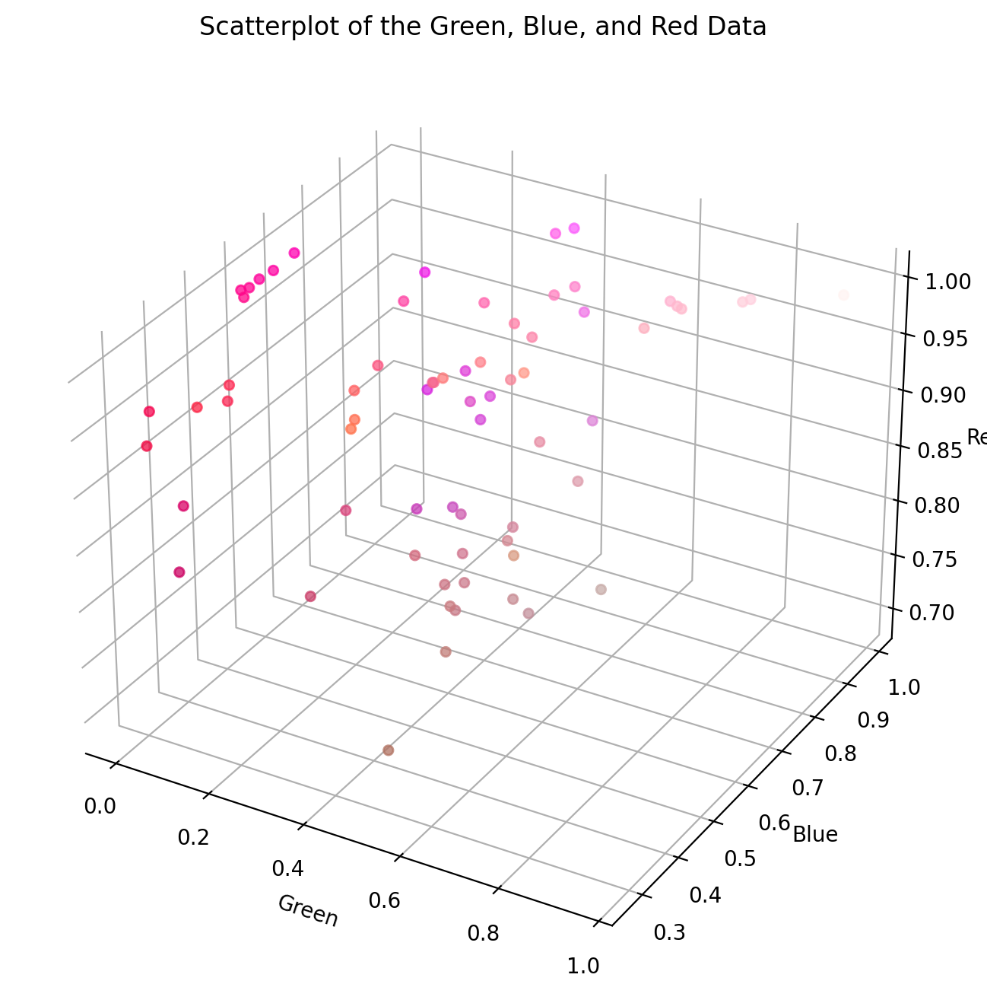

In [13]:

f = lambda row_series: 'pink' in str(row_series.name).lower()
mask_series = xkcd_colors_df.apply(f, axis='columns')
shu.show_3d_plot(xkcd_colors_df[mask_series], verbose=False)

test_list = "[(0.06678190731735843, 'xkcd:very light pink'), (0.21974785452740236, 'xkcd:light pink'), (0.2329623018083003, 'xkcd:pale pink'), (0.3341627512591794, 'xkcd:pastel pink'), (0.34153688423220396, 'xkcd:baby pink'), (0.35376809447353447, 'xkcd:powder pink'), (0.39633072919600437, 'xkcd:soft pink'), (0.5159508752310363, 'xkcd:pinkish grey'), (0.5199887615974216, 'xkcd:faded pink'), (0.5208457322630271, 'xkcd:lavender pink'), (0.5258120173460703, 'xkcd:bubblegum pink'), (0.5524403238528892, 'xkcd:pink'), (0.5531219284598793, 'xkcd:purply pink'), (0.5742788801778954, 'xkcd:pig pink'), (0.5800078218725114, 'xkcd:pinky'), (0.6061329515381981, 'xkcd:peachy pink'), (0.6091447165160031, 'xkcd:carnation pink'), (0.6158860672460115, 'xkcd:rose pink'), (0.617818214692015, 'xkcd:candy pink'), (0.6277572781796911, 'xkcd:violet pink'), (0.6313725490196079, 'xkcd:grey pink'), (0.6324433739865571, 'xkcd:dull pink'), (0.6432089869131405, 'xkcd:dusty pink'), (0.6452023278238358, 'xkcd:pinkish 

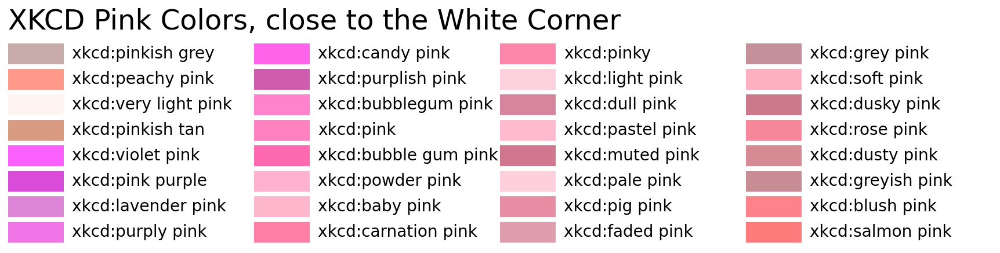

In [14]:

pink_colors_dict = {name: mcolors.to_rgb(color) for name, color in mcolors.XKCD_COLORS.items() if 'pink' in name.lower()}
pink_xkcd_colors_df = shu.colors_dict_to_dataframe(pink_colors_dict)
pink_xkcd_distance_df = shu.get_distance_dataframe(pink_xkcd_colors_df, color_title='XKCD')
shu.show_color_proximity(distance_df=pink_xkcd_distance_df, color_str='White', saeculum_title='Pink')

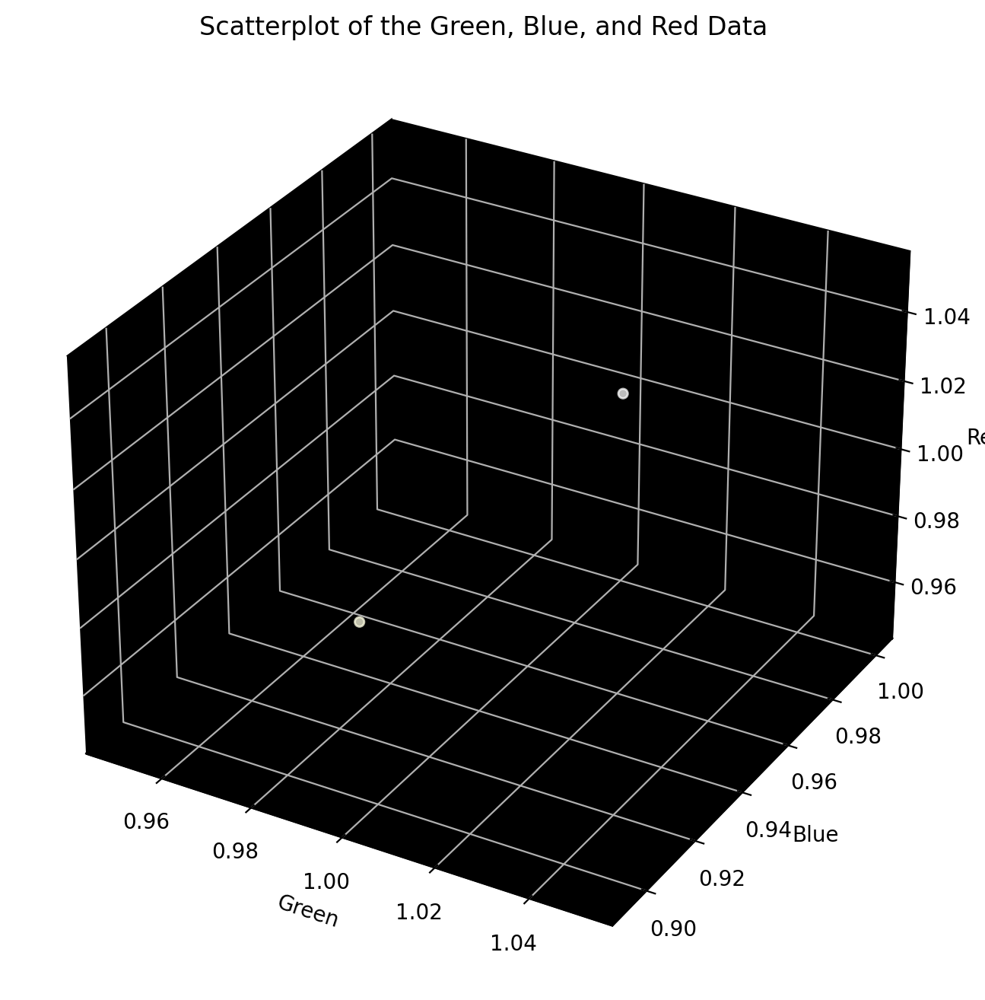

In [15]:

f = lambda row_series: 'white' in str(row_series.name).lower()
mask_series = xkcd_colors_df.apply(f, axis='columns')
shu.show_3d_plot(xkcd_colors_df[mask_series], pane_color='black')

test_list = "[(0.0, 'xkcd:white'), (0.0117647058823529, 'xkcd:pale grey'), (0.06678190731735843, 'xkcd:very light pink'), (0.10588235294117643, 'xkcd:off white'), (0.15691175704896124, 'xkcd:ice blue'), (0.16083213062282256, 'xkcd:very pale blue'), (0.16197550139657554, 'xkcd:ice'), (0.16470588235294115, 'xkcd:very light blue'), (0.1686274509803921, 'xkcd:eggshell'), (0.1686274509803921, 'xkcd:really light blue'), (0.18439714424327447, 'xkcd:pale blue'), (0.1847304425617863, 'xkcd:pale mauve'), (0.18580953318403348, 'xkcd:pale'), (0.19572517197596515, 'xkcd:very light purple'), (0.19973069142347988, 'xkcd:pale lavender'), (0.20392156862745103, 'xkcd:ivory'), (0.20788012989331098, 'xkcd:ecru'), (0.20843423162224808, 'xkcd:light light blue'), (0.21974785452740236, 'xkcd:light pink'), (0.2238387951816523, 'xkcd:light sky blue'), (0.22694331445067115, 'xkcd:light lilac'), (0.22977179725945496, 'xkcd:pale lilac'), (0.23167145863124589, 'xkcd:egg shell'), (0.2329623018083003, 'xkcd:pale pink

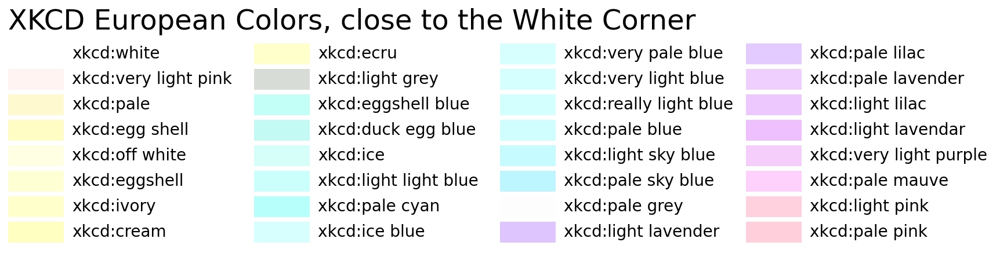

In [16]:

shu.show_color_proximity(color_str='White', saeculum_title='European')

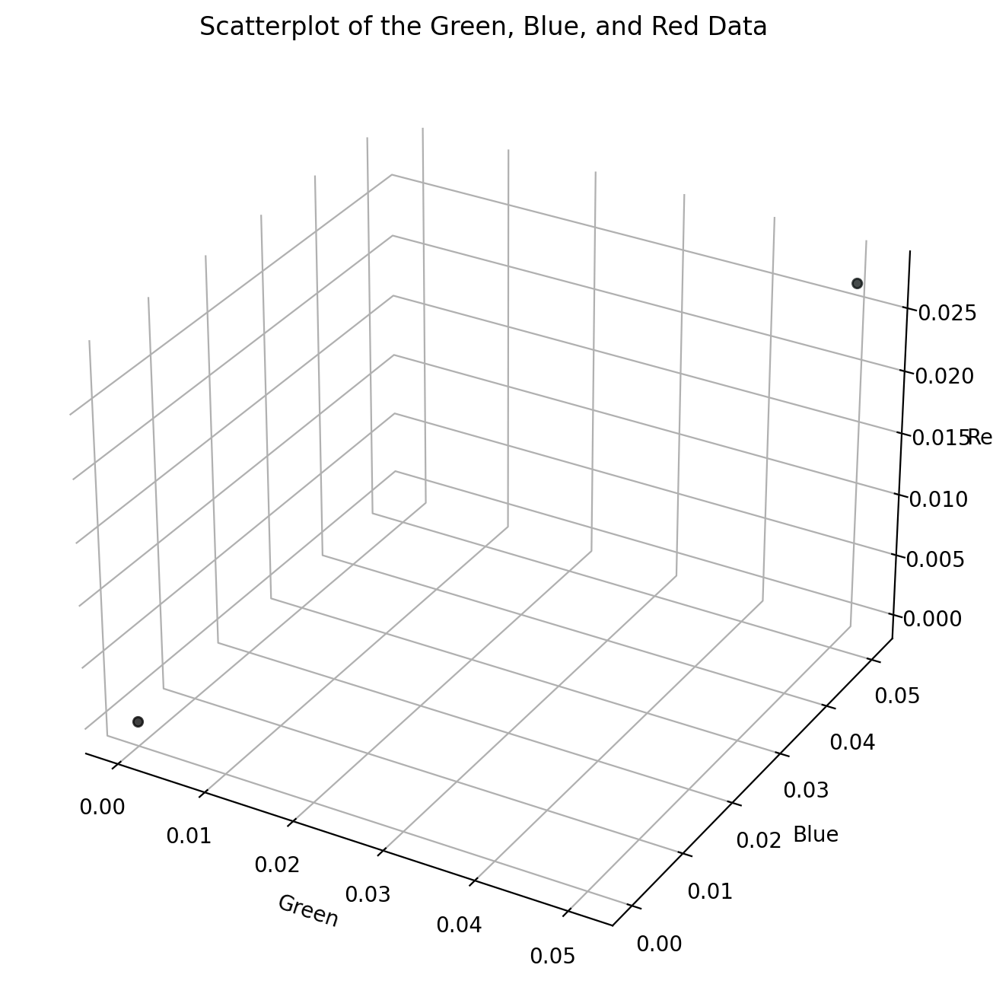

In [17]:

f = lambda row_series: 'black' in str(row_series.name).lower()
mask_series = xkcd_colors_df.apply(f, axis='columns')
shu.show_3d_plot(xkcd_colors_df[mask_series])

test_list = "[(0.0, 'xkcd:black'), (0.07714633558002354, 'xkcd:almost black'), (0.11399562238234222, 'xkcd:very dark brown'), (0.17690578146886213, 'xkcd:midnight'), (0.17716638428355322, 'xkcd:dark forest green'), (0.18056257934464842, 'xkcd:dark navy blue'), (0.1823002243006974, 'xkcd:very dark green'), (0.20003844305657803, 'xkcd:very dark blue'), (0.20799106833217443, 'xkcd:midnight blue'), (0.20817583435273723, 'xkcd:dark green'), (0.20843423162224803, 'xkcd:dark navy'), (0.23173783063049658, 'xkcd:dark brown'), (0.2373764070654362, 'xkcd:dark maroon'), (0.25502259588845655, 'xkcd:deep brown'), (0.2565856910267543, 'xkcd:hunter green'), (0.25673548711110444, 'xkcd:navy'), (0.26089486083890034, 'xkcd:dark'), (0.26215913589581596, 'xkcd:very dark purple'), (0.26332975630116934, 'xkcd:chocolate'), (0.2667243305589326, 'xkcd:midnight purple'), (0.27310565249380625, 'xkcd:chocolate brown'), (0.27453781369705316, 'xkcd:racing green'), (0.28008347193206423, 'xkcd:forrest green'), (0.2824

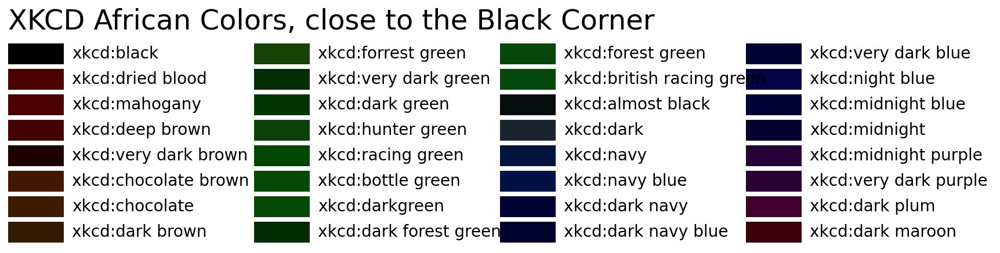

In [18]:

shu.show_color_proximity(color_str='Black', saeculum_title='African')

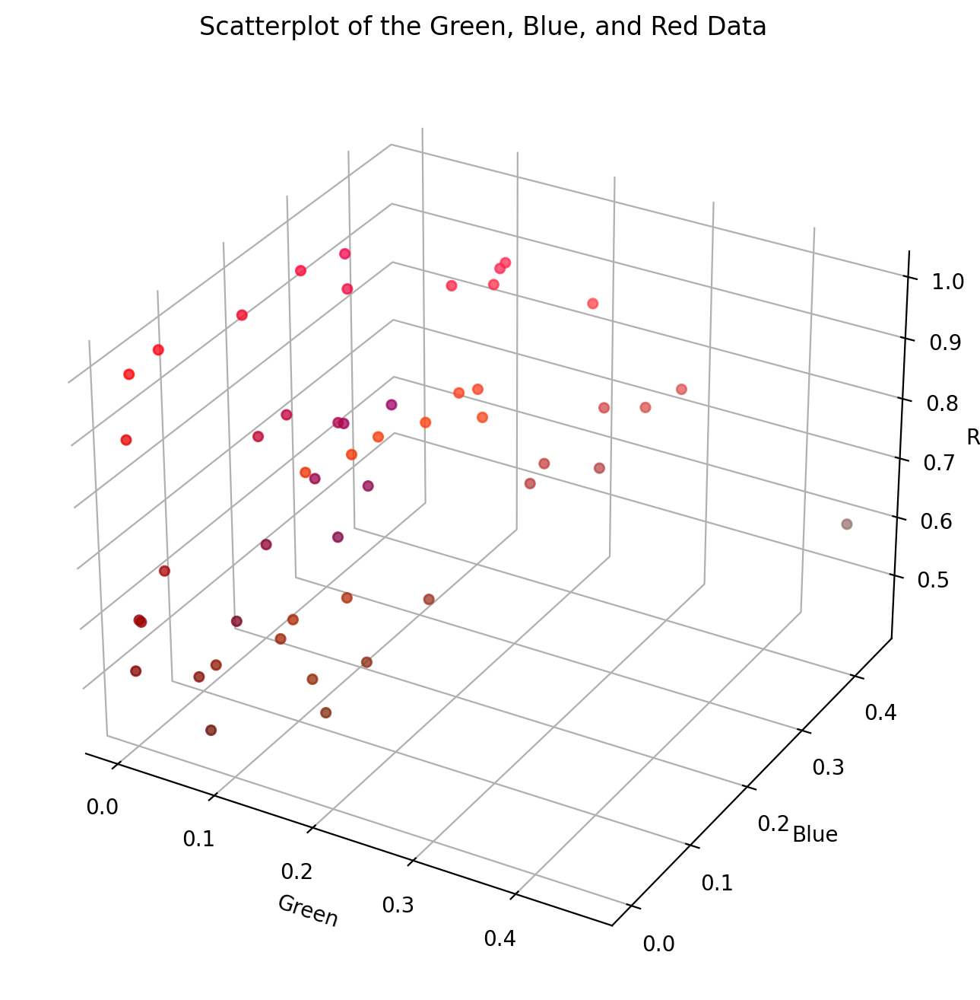

In [19]:

f = lambda row_series: 'red' in str(row_series.name).lower()
mask_series = xkcd_colors_df.apply(f, axis='columns')
shu.show_3d_plot(xkcd_colors_df[mask_series])

test_list = "[(0.008768894029410933, 'xkcd:fire engine red'), (0.050980392156862744, 'xkcd:bright red'), (0.10196078431372546, 'xkcd:red'), (0.1678504671296682, 'xkcd:cherry red'), (0.19159581961264482, 'xkcd:tomato red'), (0.2062088913746652, 'xkcd:vermillion'), (0.21700133854520662, 'xkcd:orangish red'), (0.22910151637613382, 'xkcd:neon red'), (0.23659769614115067, 'xkcd:red orange'), (0.2654528313846345, 'xkcd:orangered'), (0.2731338062645623, 'xkcd:scarlet'), (0.2776293336537703, 'xkcd:cherry'), (0.28008347193206423, 'xkcd:pinkish red'), (0.2808511258006883, 'xkcd:orange red'), (0.2943789688758638, 'xkcd:blood orange'), (0.295473996719523, 'xkcd:orangey red'), (0.2985547656576358, 'xkcd:tomato'), (0.30419342679838324, 'xkcd:reddish orange'), (0.30833606096240446, 'xkcd:lipstick red'), (0.3084357976821284, 'xkcd:strawberry'), (0.3128910471422541, 'xkcd:pink red'), (0.3160210136142083, 'xkcd:pinky red'), (0.3317146395263925, 'xkcd:deep orange'), (0.33891520183235246, 'xkcd:darkish re

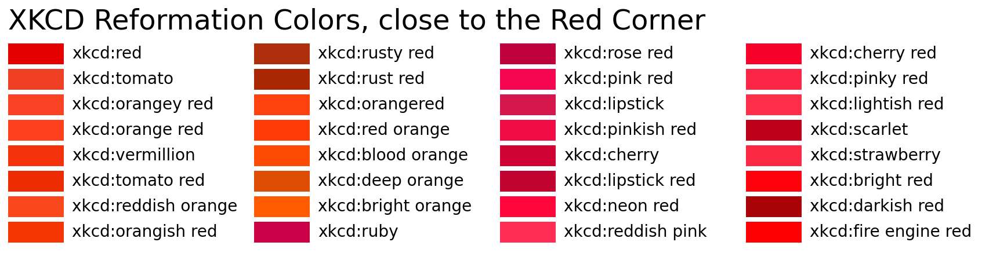

In [20]:

shu.show_color_proximity(color_str='Red', saeculum_title='Reformation')

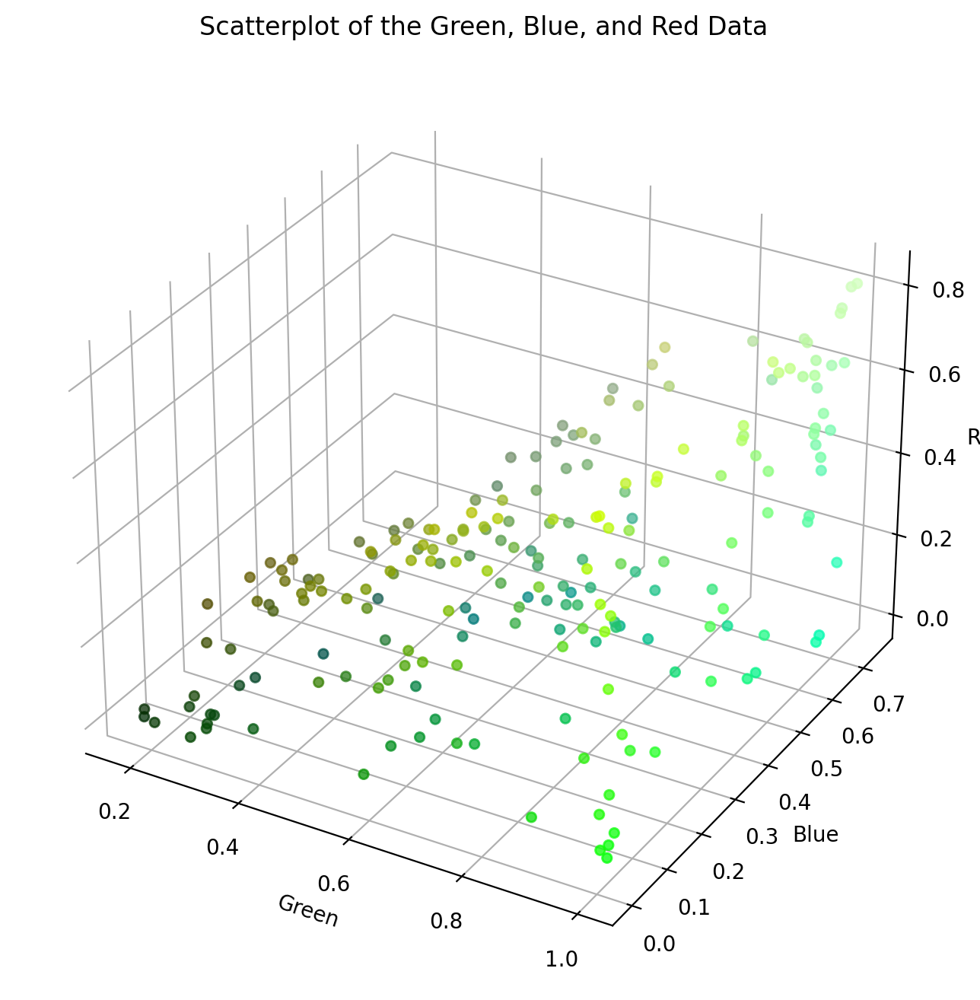

In [21]:

f = lambda row_series: 'green' in str(row_series.name).lower()
mask_series = xkcd_colors_df.apply(f, axis='columns')
shu.show_3d_plot(xkcd_colors_df[mask_series])

test_list = "[(0.0277296776935901, 'xkcd:bright green'), (0.03999230991053165, 'xkcd:fluro green'), (0.04436748430974415, 'xkcd:fluorescent green'), (0.06655122646461624, 'xkcd:neon green'), (0.10910139406465533, 'xkcd:highlighter green'), (0.13958801357300146, 'xkcd:electric green'), (0.1424776637222349, 'xkcd:vibrant green'), (0.20456158989403886, 'xkcd:vivid green'), (0.21198245885081693, 'xkcd:radioactive green'), (0.21657570621935807, 'xkcd:hot green'), (0.2630668208823282, 'xkcd:poison green'), (0.33638739316089944, 'xkcd:green'), (0.37372363845394385, 'xkcd:bright light green'), (0.3756527063475466, 'xkcd:kelly green'), (0.3877596611131959, 'xkcd:shamrock green'), (0.39733831847812834, 'xkcd:bright lime green'), (0.41170867966182256, 'xkcd:green apple'), (0.4187456783046341, 'xkcd:shamrock'), (0.42107129807466537, 'xkcd:true green'), (0.43425064827659476, 'xkcd:toxic green'), (0.4348699576265715, 'xkcd:frog green'), (0.44571521519521484, 'xkcd:irish green'), (0.44959719679894944

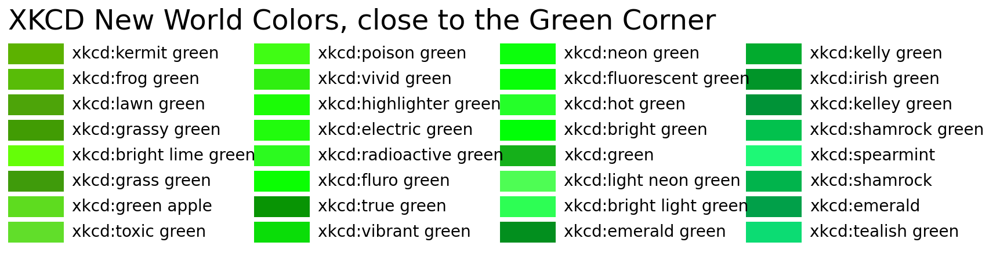

In [22]:

shu.show_color_proximity(color_str='Green', saeculum_title='New World')

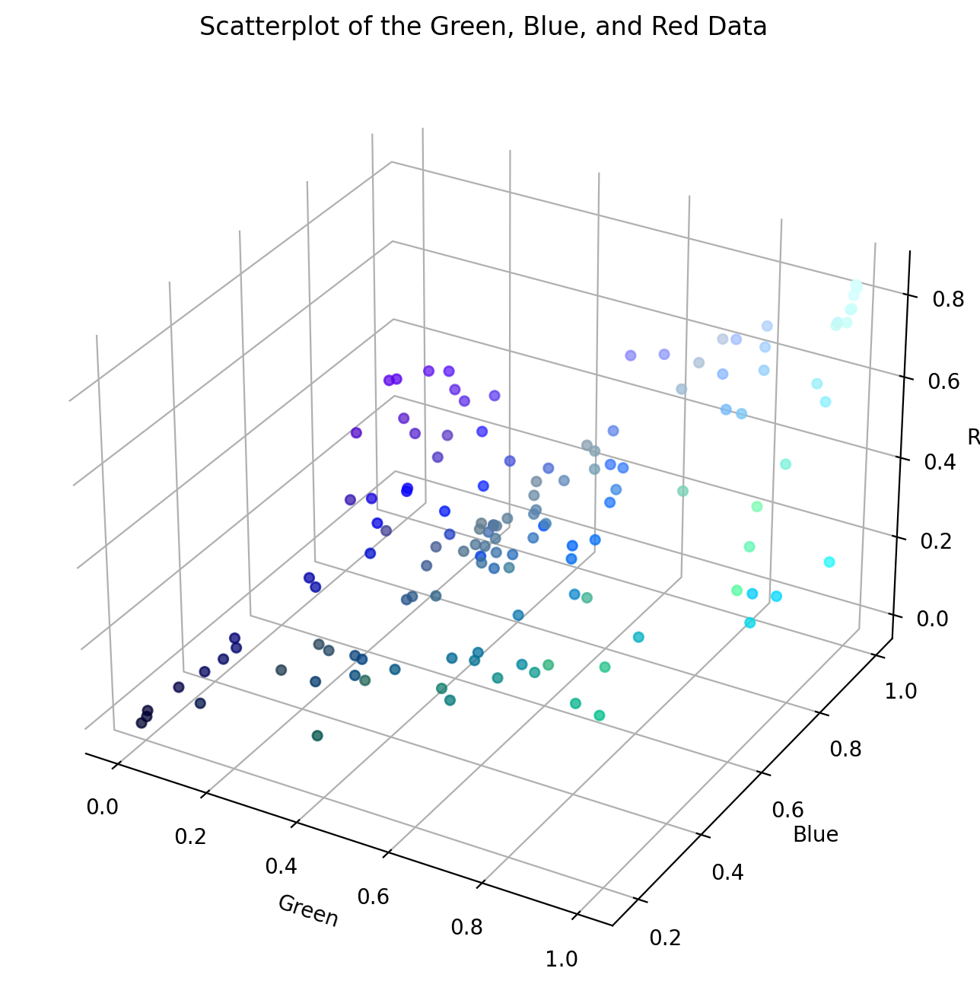

In [23]:

f = lambda row_series: 'blue' in str(row_series.name).lower()
mask_series = xkcd_colors_df.apply(f, axis='columns')
shu.show_3d_plot(xkcd_colors_df[mask_series])

test_list = "[(0.04223658672262357, 'xkcd:primary blue'), (0.06125686020318945, 'xkcd:strong blue'), (0.10874842842244743, 'xkcd:rich blue'), (0.11460109173492128, 'xkcd:pure blue'), (0.17080220972849078, 'xkcd:ultramarine blue'), (0.19830112752581225, 'xkcd:vivid blue'), (0.20850800059699515, 'xkcd:true blue'), (0.22551577007576273, 'xkcd:vibrant blue'), (0.2903285336294839, 'xkcd:light royal blue'), (0.29141239534367525, 'xkcd:blue'), (0.32242831044854064, 'xkcd:electric blue'), (0.3306233554252234, 'xkcd:ultramarine'), (0.3342777854294288, 'xkcd:royal blue'), (0.34751825135522074, 'xkcd:cobalt blue'), (0.35924650950898157, 'xkcd:blue/purple'), (0.3646847980411818, 'xkcd:blue blue'), (0.3755093938675002, 'xkcd:blue violet'), (0.38377312918788226, 'xkcd:violet blue'), (0.38922432943433316, 'xkcd:azul'), (0.39262716896576716, 'xkcd:indigo blue'), (0.39512601467639213, 'xkcd:purplish blue'), (0.39627252087867143, 'xkcd:bright blue'), (0.4165178511640665, 'xkcd:sapphire'), (0.41813926625

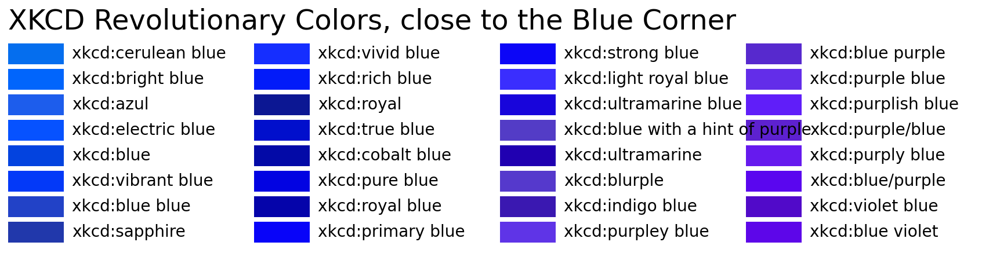

In [24]:

shu.show_color_proximity(color_str='Blue', saeculum_title='Revolutionary')

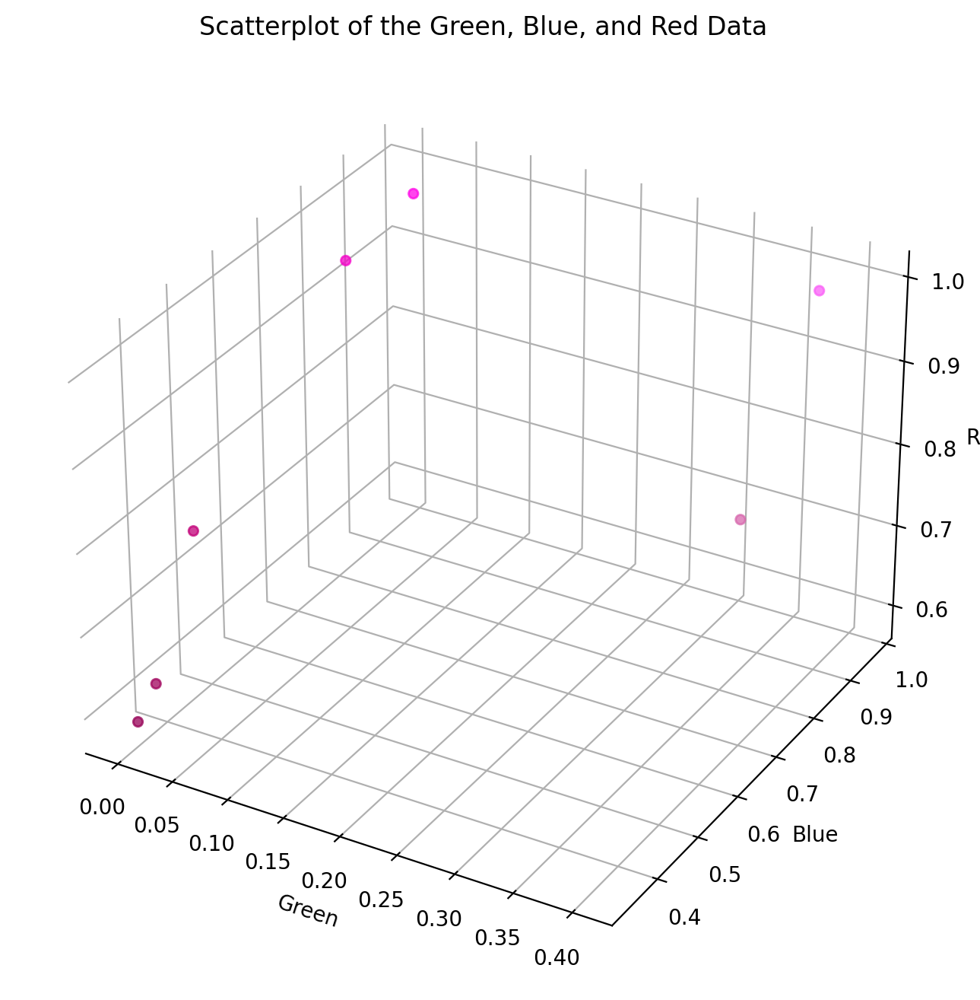

In [25]:

f = lambda row_series: 'magenta' in str(row_series.name).lower()
mask_series = xkcd_colors_df.apply(f, axis='columns')
shu.show_3d_plot(xkcd_colors_df[mask_series])

test_list = "[(0.09549643656381115, 'xkcd:bright magenta'), (0.1604012653820985, 'xkcd:pink/purple'), (0.1725935771346305, 'xkcd:fuchsia'), (0.20765807521370555, 'xkcd:hot purple'), (0.2159356846735091, 'xkcd:hot magenta'), (0.24981346366483115, 'xkcd:purple/pink'), (0.25529381645113397, 'xkcd:bright purple'), (0.2731338062645623, 'xkcd:neon purple'), (0.30593262533085624, 'xkcd:bright pink'), (0.3149730098345887, 'xkcd:purple pink'), (0.32404593349197797, 'xkcd:bright violet'), (0.3460103804671234, 'xkcd:heliotrope'), (0.34683165269262306, 'xkcd:vibrant purple'), (0.3570566161596875, 'xkcd:pink purple'), (0.36048581001667135, 'xkcd:electric purple'), (0.36080562596898724, 'xkcd:pinkish purple'), (0.3648112856331838, 'xkcd:shocking pink'), (0.37306465863608723, 'xkcd:violet pink'), (0.37438145834863135, 'xkcd:light magenta'), (0.39475609199169065, 'xkcd:purpleish pink'), (0.39611725688177063, 'xkcd:neon pink'), (0.397705839334203, 'xkcd:candy pink'), (0.40048029603526714, 'xkcd:vivid p

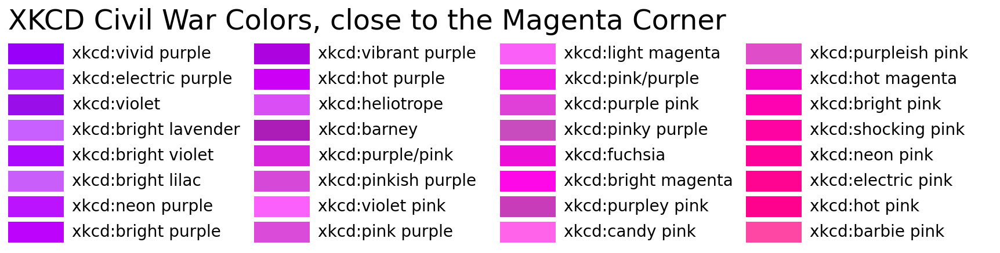

In [26]:

shu.show_color_proximity(color_str='Magenta', saeculum_title='Civil War')

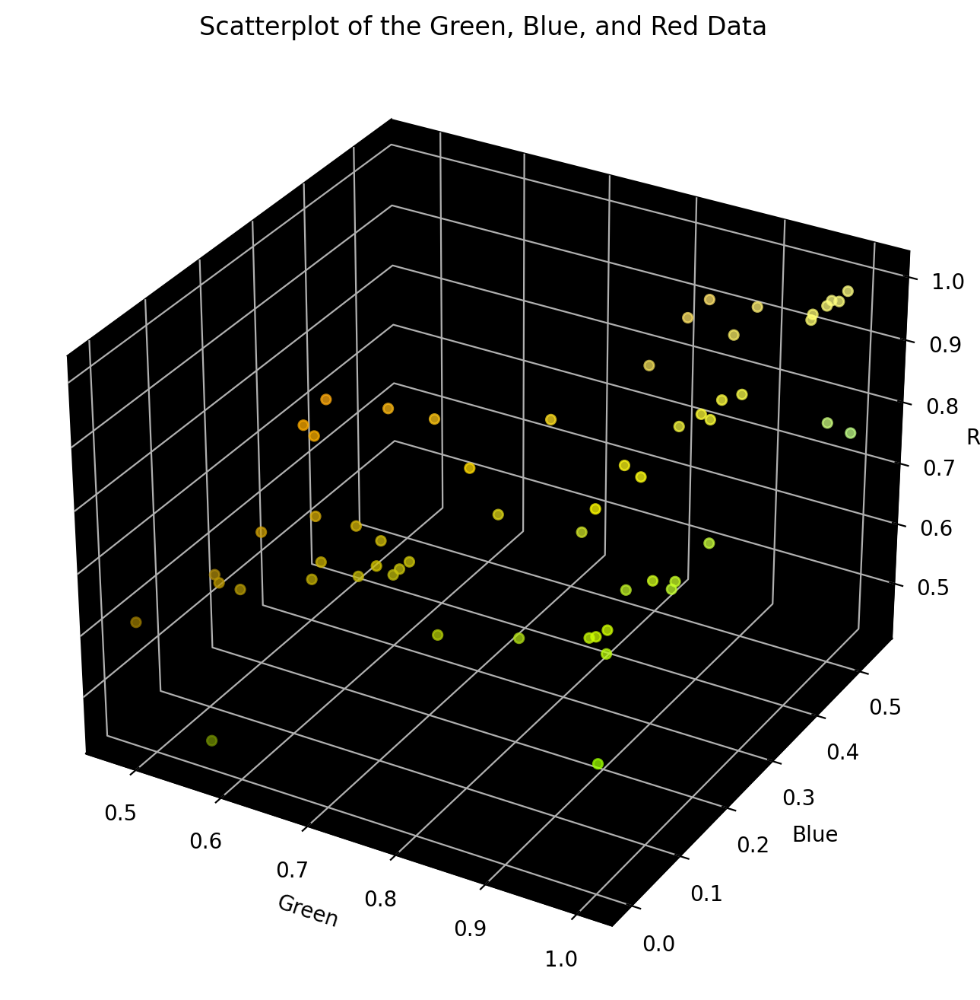

In [27]:

f = lambda row_series: 'yellow' in str(row_series.name).lower()
mask_series = xkcd_colors_df.apply(f, axis='columns')
shu.show_3d_plot(xkcd_colors_df[mask_series], pane_color='black')

test_list = "[(0.008768894029410914, 'xkcd:bright yellow'), (0.0784313725490196, 'xkcd:yellow'), (0.09321462214905658, 'xkcd:sunny yellow'), (0.12941176470588234, 'xkcd:dandelion'), (0.1455742054374164, 'xkcd:sunflower yellow'), (0.1830998828224118, 'xkcd:sun yellow'), (0.18888775809870267, 'xkcd:neon yellow'), (0.1963919062831202, 'xkcd:greenish yellow'), (0.21582882989516886, 'xkcd:sunshine yellow'), (0.21661120752378787, 'xkcd:lime yellow'), (0.21974785452740234, 'xkcd:lemon yellow'), (0.2273833570874388, 'xkcd:greeny yellow'), (0.2291015163761338, 'xkcd:piss yellow'), (0.23815257177551333, 'xkcd:sunflower'), (0.23824941457386722, 'xkcd:golden yellow'), (0.24081752341716145, 'xkcd:goldenrod'), (0.2478046631839934, 'xkcd:chartreuse'), (0.2484554362581515, 'xkcd:marigold'), (0.2510110275420433, 'xkcd:canary yellow'), (0.25429792685291724, 'xkcd:golden'), (0.257423426388648, 'xkcd:off yellow'), (0.2612188624844061, 'xkcd:green yellow'), (0.2656555224225874, 'xkcd:golden rod'), (0.26652

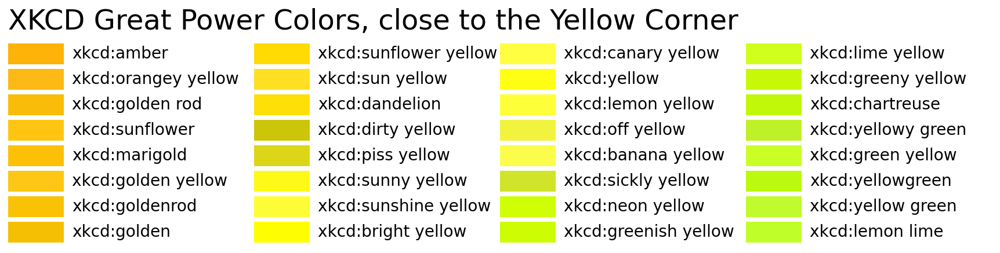

In [28]:

shu.show_color_proximity(color_str='Yellow', saeculum_title='Great Power')

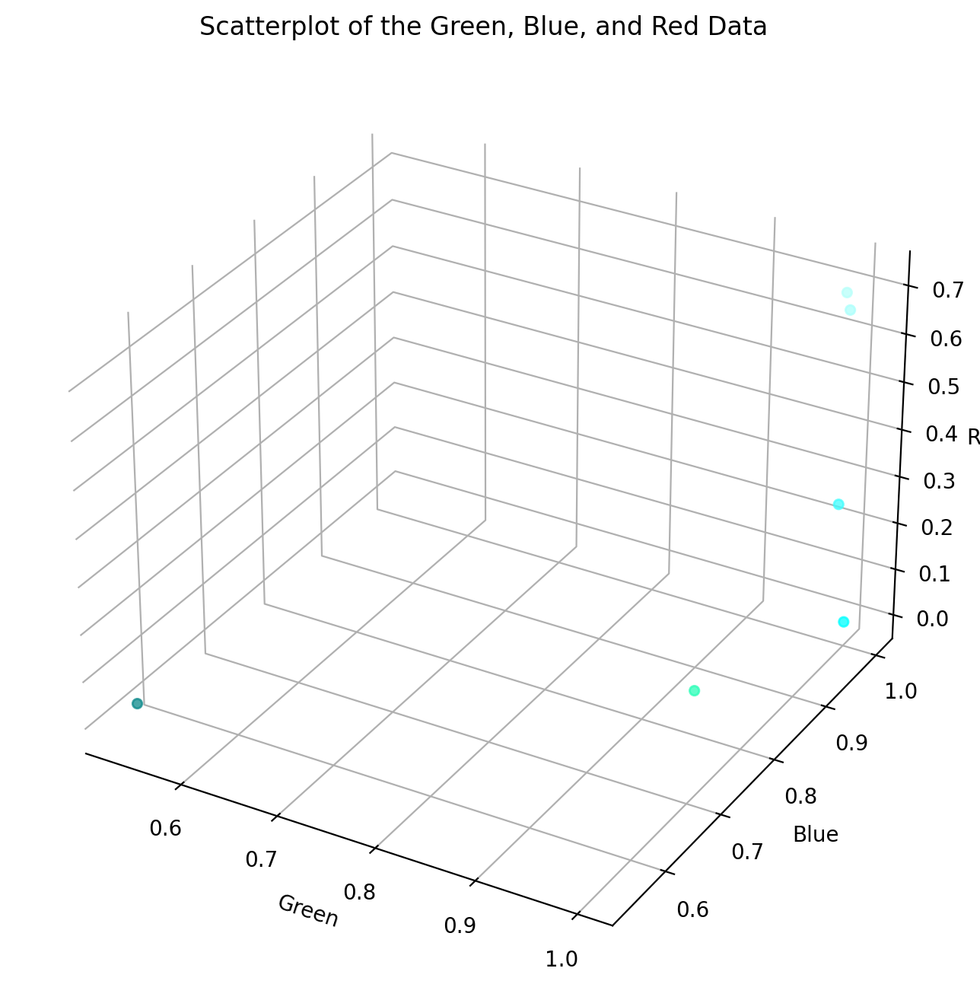

In [29]:

f = lambda row_series: 'cyan' in str(row_series.name).lower()
mask_series = xkcd_colors_df.apply(f, axis='columns')
shu.show_3d_plot(xkcd_colors_df[mask_series])

test_list = "[(0.0, 'xkcd:cyan'), (0.06347613355387705, 'xkcd:bright turquoise'), (0.09589819027950972, 'xkcd:bright aqua'), (0.14984292685915926, 'xkcd:neon blue'), (0.15248801643312612, 'xkcd:bright light blue'), (0.1757720378903135, 'xkcd:aqua blue'), (0.20019214146039555, 'xkcd:bright sky blue'), (0.2247985983994747, 'xkcd:bright teal'), (0.23911923481452782, 'xkcd:aqua'), (0.2550527457491623, 'xkcd:bright cyan'), (0.3102007882441584, 'xkcd:greenish turquoise'), (0.3269045575900773, 'xkcd:greenish cyan'), (0.3343467869340196, 'xkcd:aqua marine'), (0.3388471306231835, 'xkcd:aquamarine'), (0.34956995604810276, 'xkcd:bright sea green'), (0.3842536967924373, 'xkcd:turquoise blue'), (0.3995576177330429, 'xkcd:azure'), (0.404625314977886, 'xkcd:turquoise'), (0.4184333939712645, 'xkcd:topaz'), (0.43331115194759645, "xkcd:robin's egg"), (0.445197363021753, 'xkcd:aqua green'), (0.45317454305646176, 'xkcd:tealish'), (0.46501602953854937, 'xkcd:turquoise green'), (0.4880738373873591, 'xkcd:li

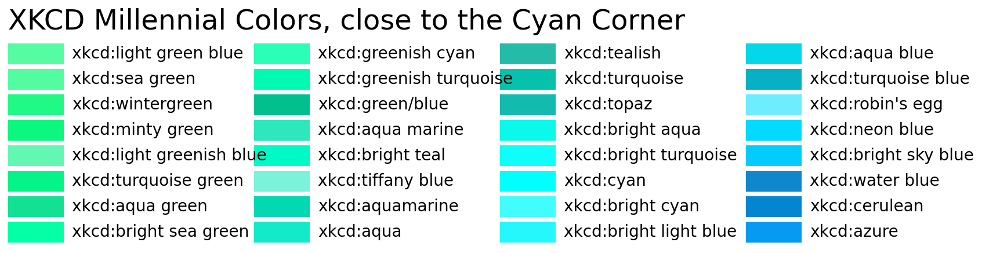

In [30]:

shu.show_color_proximity(color_str='Cyan', saeculum_title='Millennial')

In [125]:

if 'xkcd_face_dictionary' in dir(): display(list(np.unique(list(xkcd_face_dictionary.values()))))

In [32]:

for saeculum_name in shu.generations_df['saeculum_name'].unique():
    saeculum_name = '_'.join(saeculum_name.lower().split(' '))
    print('xkcd_{}_list = []'.format(saeculum_name))

xkcd_late_medieval_list = []
xkcd_reformation_list = []
xkcd_new_world_list = []
xkcd_revolutionary_list = []
xkcd_civil_war_list = []
xkcd_great_power_list = []
xkcd_millennial_list = []
xkcd_meta_modern_list = []


In [123]:

if 'xkcd_face_dictionary' in dir():
    xkcd_reformation_list = []
    xkcd_new_world_list = []
    xkcd_revolutionary_list = []
    xkcd_civil_war_list = []
    xkcd_great_power_list = []
    xkcd_millennial_list = []
    for key, value in xkcd_face_dictionary.items():
        if value == 'black-blue-cyan-green': xkcd_reformation_list.append(key)
        elif value == 'black-red-magenta-blue': xkcd_new_world_list.append(key)
        elif value == 'black-red-yellow-green': xkcd_revolutionary_list.append(key)
        elif value == 'white-cyan-blue-magenta': xkcd_civil_war_list.append(key)
        elif value == 'white-cyan-green-yellow': xkcd_great_power_list.append(key)
        elif value == 'white-yellow-red-magenta': xkcd_millennial_list.append(key)

In [34]:

xkcd_kbcg_reformation_dict = {name: shu.distance_from_kbcg_face(mcolors.to_rgb(color)) for name,
                              color in mcolors.XKCD_COLORS.items() if name in xkcd_reformation_list}
color_tuple_list = sorted((distance, name) for name, distance in xkcd_kbcg_reformation_dict.items())

In [35]:

test_list = color_tuple_list#[:4]
saeculum_title = 'Reformation'
face_title = 'KBCG'
nearness_str = 'close to'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str)

test_list = "[]"


In [36]:

test_list = color_tuple_list[-4:]
saeculum_title = 'Reformation'
face_title = 'KBCG'
nearness_str = 'far from'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str)

test_list = "[]"


In [37]:

xkcd_krmb_new_world_dict = {name: shu.distance_from_krmb_face(mcolors.to_rgb(color)) for name,
                            color in mcolors.XKCD_COLORS.items() if name in xkcd_new_world_list}
color_tuple_list = sorted((distance, name) for name, distance in xkcd_krmb_new_world_dict.items())

In [38]:

test_list = color_tuple_list[:4]
saeculum_title = 'New World'
face_title = 'KRMB'
nearness_str = 'close to'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str)

test_list = "[]"


In [39]:

test_list = color_tuple_list[-4:]
saeculum_title = 'New World'
face_title = 'KRMB'
nearness_str = 'far from'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str)

test_list = "[]"


In [40]:

xkcd_kryg_revolutionary_dict = {name: shu.distance_from_kryg_face(mcolors.to_rgb(color)) for name,
                                color in mcolors.XKCD_COLORS.items() if name in xkcd_revolutionary_list}
color_tuple_list = sorted((distance, name) for name, distance in xkcd_kryg_revolutionary_dict.items())

In [41]:

test_list = color_tuple_list[:4]
saeculum_title = 'Revolutionary'
face_title = 'KRYG'
nearness_str = 'close to'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str)

test_list = "[]"


In [42]:

test_list = color_tuple_list[-4:]
saeculum_title = 'Revolutionary'
face_title = 'KRYG'
nearness_str = 'far from'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str)

test_list = "[]"


In [43]:

xkcd_wcbm_civil_war_dict = {name: shu.distance_from_wcbm_face(mcolors.to_rgb(color)) for name,
                            color in mcolors.XKCD_COLORS.items() if name in xkcd_civil_war_list}
color_tuple_list = sorted((distance, name) for name, distance in xkcd_wcbm_civil_war_dict.items())

In [44]:

test_list = color_tuple_list[:4]
saeculum_title = 'Civil War'
face_title = 'WCBM'
nearness_str = 'close to'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str)

test_list = "[]"


In [45]:

test_list = color_tuple_list[-4:]
saeculum_title = 'Civil War'
face_title = 'WCBM'
nearness_str = 'far from'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str)

test_list = "[]"


In [46]:

xkcd_wcgy_great_power_dict = {name: shu.distance_from_wcgy_face(mcolors.to_rgb(color)) for name,
                              color in mcolors.XKCD_COLORS.items() if name in xkcd_great_power_list}
color_tuple_list = sorted((distance, name) for name, distance in xkcd_wcgy_great_power_dict.items())

In [47]:

test_list = color_tuple_list[:4]
saeculum_title = 'Great Power'
face_title = 'WCGY'
nearness_str = 'close to'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str)

test_list = "[]"


In [48]:

test_list = color_tuple_list[-4:]
saeculum_title = 'Great Power'
face_title = 'WCGY'
nearness_str = 'far from'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str)

test_list = "[]"


In [49]:

xkcd_wyrm_millennial_dict = {name: shu.distance_from_wyrm_face(mcolors.to_rgb(color)) for name,
                             color in mcolors.XKCD_COLORS.items() if name in xkcd_millennial_list}
color_tuple_list = sorted((distance, name) for name, distance in xkcd_wyrm_millennial_dict.items())

In [50]:

test_list = color_tuple_list[:4]
saeculum_title = 'Millenial'
face_title = 'WYRM'
nearness_str = 'close to'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str)

test_list = "[]"


In [51]:

test_list = color_tuple_list[-4:]
saeculum_title = 'Millenial'
face_title = 'WYRM'
nearness_str = 'far from'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str)

test_list = "[]"


In [52]:

test_list = color_tuple_list[:20:5]
saeculum_title = 'Millenial'
face_title = 'WYRM'
nearness_str = 'close to'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str)

test_list = "[]"


In [53]:

shu.plot_colortable(
    colors_dict={name: color for name, color in mcolors.XKCD_COLORS.items() if name in xkcd_reformation_list}, title='XKCD Reformation Colors', sort_colors=True, emptycols=0
)

In [54]:

shu.plot_colortable(
    colors_dict={name: color for name, color in mcolors.XKCD_COLORS.items() if name in xkcd_new_world_list}, title='XKCD New World Colors', sort_colors=True, emptycols=0
)

In [55]:

shu.plot_colortable(
    colors_dict={name: color for name, color in mcolors.XKCD_COLORS.items() if name in xkcd_revolutionary_list}, title='XKCD Revolutionary Colors', sort_colors=True, emptycols=0
)

In [56]:

shu.plot_colortable(
    colors_dict={name: color for name, color in mcolors.XKCD_COLORS.items() if name in xkcd_civil_war_list}, title='XKCD Civil War Colors', sort_colors=True, emptycols=0
)

In [57]:

shu.plot_colortable(
    colors_dict={name: color for name, color in mcolors.XKCD_COLORS.items() if name in xkcd_great_power_list}, title='XKCD Great Power Colors', sort_colors=True, emptycols=0
)

In [58]:

shu.plot_colortable(
    colors_dict={name: color for name, color in mcolors.XKCD_COLORS.items() if name in xkcd_millennial_list}, title='XKCD Millennial Colors', sort_colors=True, emptycols=0
)


# CSS4

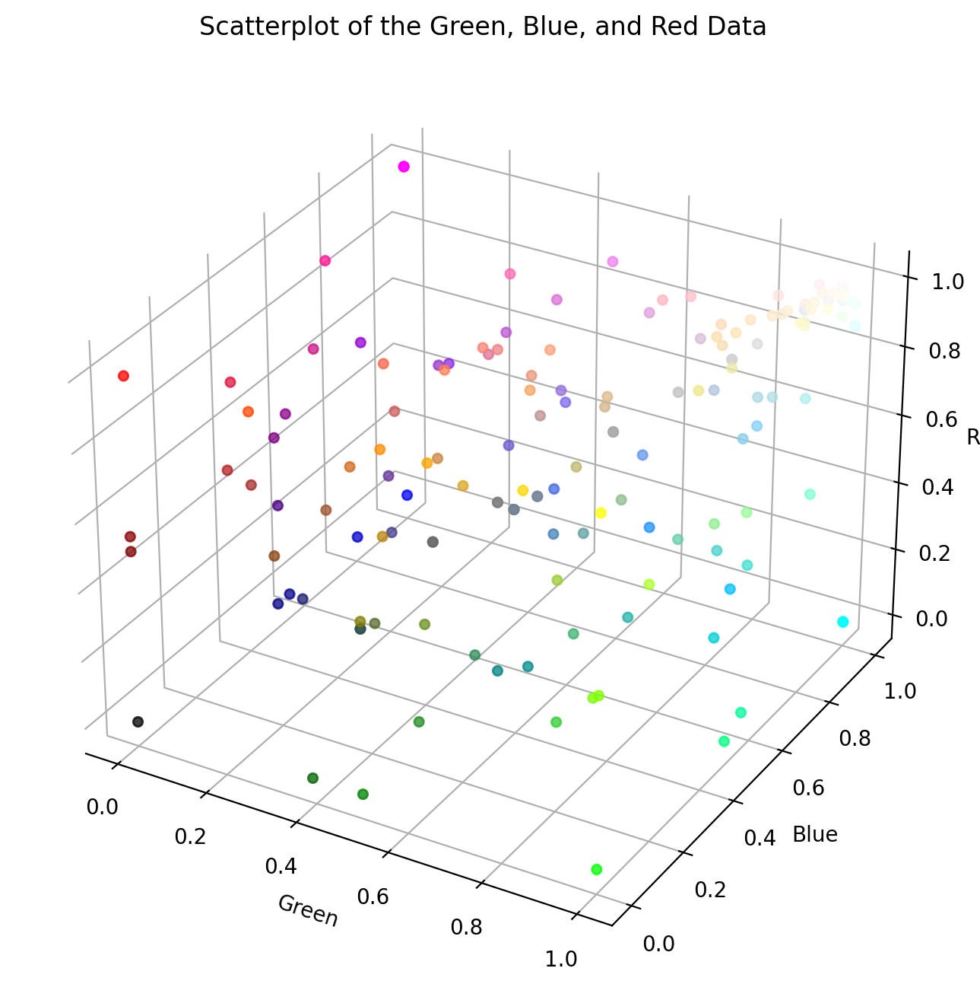

In [59]:

colors_dict = {name: mcolors.to_rgb(color) for name, color in mcolors.CSS4_COLORS.items()}
css4_colors_df = shu.colors_dict_to_dataframe(colors_dict)
shu.show_3d_plot(css4_colors_df)

In [60]:

css4_reformation_list = []
css4_new_world_list = []
css4_revolutionary_list = []
css4_civil_war_list = []
css4_great_power_list = []
css4_millennial_list = []
css4_distance_df = shu.get_distance_dataframe(css4_colors_df, color_title='CSS4')
css4_face_dictionary = shu.get_face_dictionary(css4_distance_df.drop(columns='color_title'))
for key, value in css4_face_dictionary.items():
    if value == 'black-blue-cyan-green': css4_reformation_list .append(key)
    elif value == 'black-red-magenta-blue': css4_new_world_list .append(key)
    elif value == 'black-red-yellow-green': css4_revolutionary_list .append(key)
    elif value == 'white-cyan-blue-magenta': css4_civil_war_list .append(key)
    elif value == 'white-cyan-green-yellow': css4_great_power_list .append(key)
    elif value == 'white-yellow-red-magenta': css4_millennial_list .append(key)

In [61]:

mask_series = (shu.generations_df['birth_year_begin'] >= shu.min_year)
shu.generations_df[mask_series]['saeculum_name'].unique().tolist()

['Reformation', 'New World', 'Revolutionary', 'Civil War', 'Great Power', 'Millennial', 'Meta Modern']

test_list = "[(0.0, 'white'), (0.02772967769359016, 'snow'), (0.03882154877102616, 'ghostwhite'), (0.0438444701470547, 'mintcream'), (0.05882352941176472, 'azure'), (0.05882352941176472, 'ivory'), (0.06200544431702707, 'floralwhite'), (0.06491351120488963, 'aliceblue'), (0.0679235610811324, 'whitesmoke'), (0.07069708383262724, 'lavenderblush'), (0.07734542322869024, 'seashell'), (0.08318903308077032, 'honeydew'), (0.10588235294117646, 'oldlace'), (0.11600156437450228, 'linen'), (0.1215686274509804, 'lightcyan'), (0.1215686274509804, 'lightyellow'), (0.13997308468686073, 'cornsilk'), (0.14002800840280097, 'lavender'), (0.14803596931903423, 'beige'), (0.15827792996557305, 'mistyrose'), (0.17625258866073903, 'papayawhip'), (0.17647058823529413, 'antiquewhite'), (0.1786359525322412, 'lightgoldenrodyellow'), (0.19705638472786058, 'lemonchiffon'), (0.2111829336131178, 'blanchedalmond'), (0.23773246378396345, 'gainsboro'), (0.25444906976483656, 'bisque'), (0.29886366875698284, 'lightgray'), (

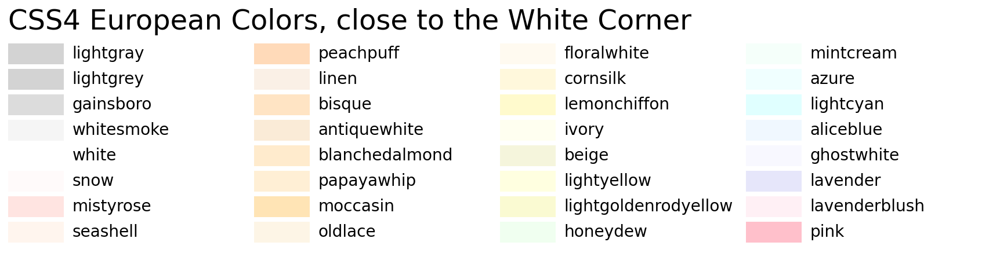

In [62]:

shu.show_color_proximity(distance_df=css4_distance_df, color_dict=mcolors.CSS4_COLORS, color_str='White', color_title='CSS4', saeculum_title='European')

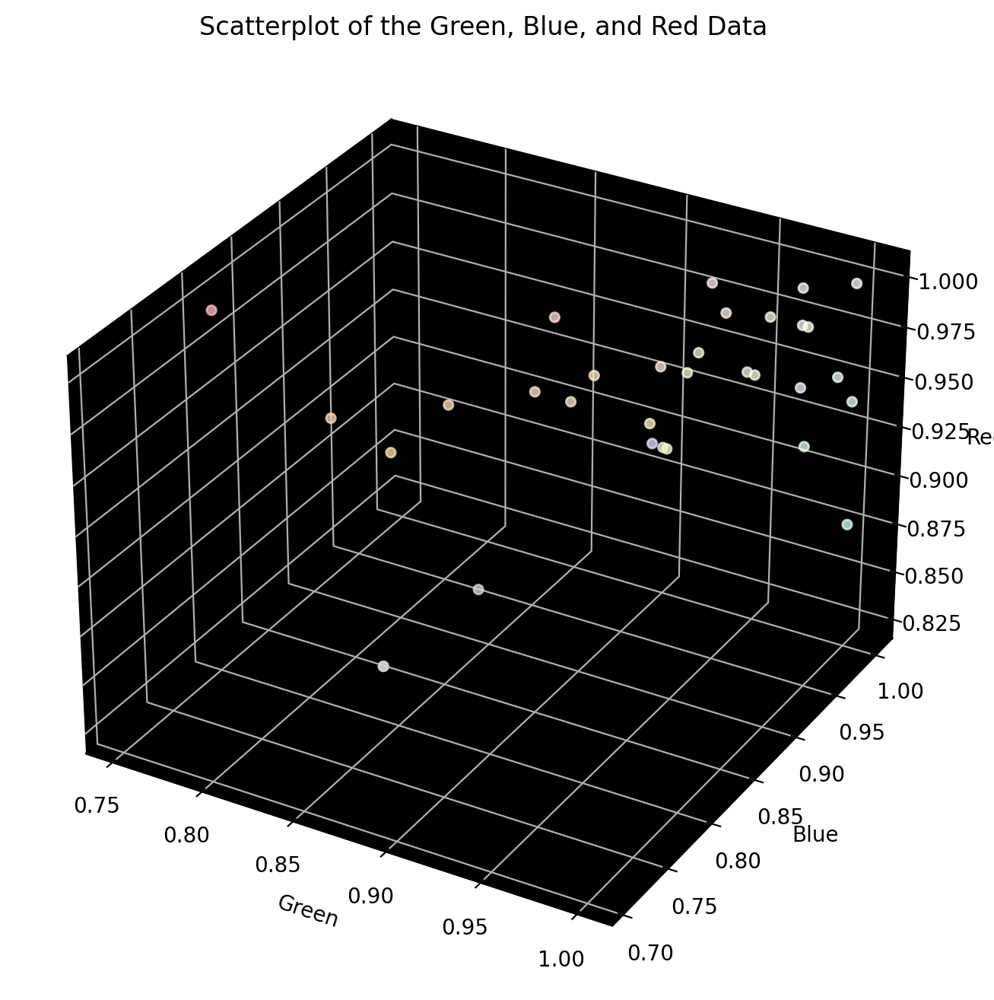

In [66]:

test_list = shu.get_color_proximity(
    distance_df=css4_distance_df, color_dict=mcolors.CSS4_COLORS, color_title='CSS4', color_str='White'
)
test_colors_list = [t[1] for t in test_list]
f = lambda row_series: str(row_series.name).lower() in test_colors_list
mask_series = css4_colors_df.apply(f, axis='columns')
shu.show_3d_plot(css4_colors_df[mask_series], pane_color='black')

In [ ]:

# Open the path to the file in Notepad
nu.open_path_in_notepad(r'~\OneDrive\Documents\GitHub\Strauss-Howe\explorations\../py\spiral_utils.py')

test_list = "[(0.0, 'black'), (0.39215686274509803, 'darkgreen'), (0.4605798461660566, 'midnightblue'), (0.47531935479493775, 'darkslategray'), (0.47531935479493775, 'darkslategrey'), (0.5019607843137255, 'green'), (0.5019607843137255, 'maroon'), (0.5019607843137255, 'navy'), (0.5450980392156862, 'darkblue'), (0.5450980392156862, 'darkred'), (0.5667039814025358, 'darkolivegreen'), (0.5767906274484194, 'forestgreen'), (0.588562000776613, 'indigo'), (0.6131081277530099, 'saddlebrown'), (0.6588468716686556, 'darkslateblue'), (0.6678881543323133, 'seagreen'), (0.6877071880317874, 'brown'), (0.7098797489559064, 'olive'), (0.7098797489559064, 'purple'), (0.7098797489559064, 'teal'), (0.7106375778219778, 'olivedrab'), (0.7131973913518906, 'dimgray'), (0.7131973913518906, 'dimgrey'), (0.7230589894271868, 'firebrick'), (0.7268032632479693, 'sienna'), (0.7483314773547883, 'rebeccapurple'), (0.7708850398818047, 'darkcyan'), (0.7708850398818047, 'darkmagenta'), (0.803921568627451, 'mediumblue'), (

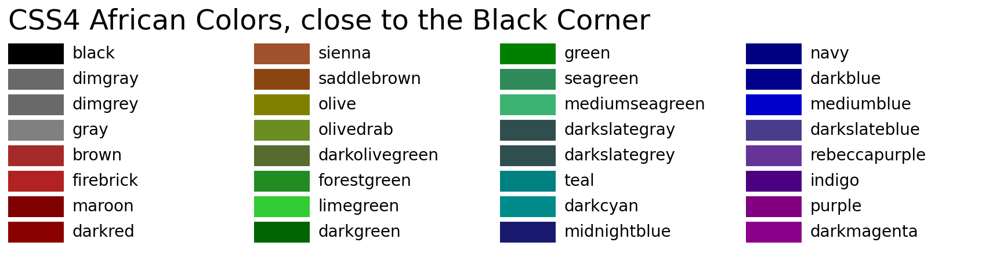

In [67]:

shu.show_color_proximity(distance_df=css4_distance_df, color_dict=mcolors.CSS4_COLORS, color_str='Black', color_title='CSS4', saeculum_title='African')

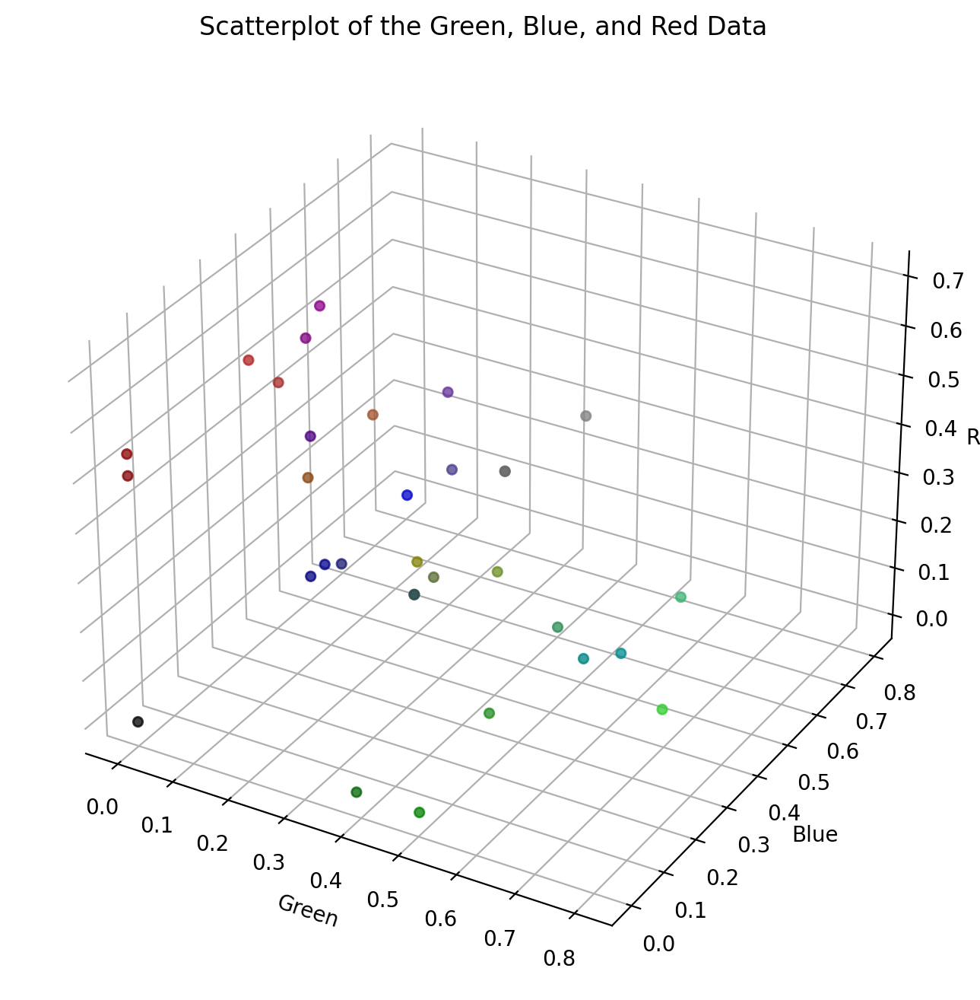

In [68]:

test_list = shu.get_color_proximity(
    distance_df=css4_distance_df, color_dict=mcolors.CSS4_COLORS, color_title='CSS4', color_str='Black'
)
test_colors_list = [t[1] for t in test_list]
f = lambda row_series: str(row_series.name).lower() in test_colors_list
mask_series = css4_colors_df.apply(f, axis='columns')
shu.show_3d_plot(css4_colors_df[mask_series])

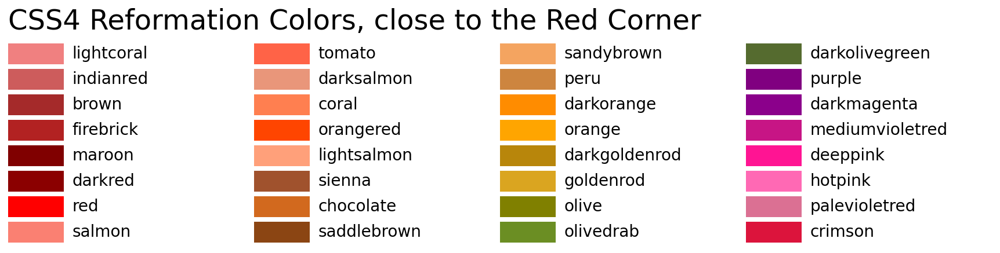

In [69]:

shu.show_color_proximity(distance_df=css4_distance_df, color_dict=mcolors.CSS4_COLORS, color_str='Red', color_title='CSS4', saeculum_title='Reformation', verbose=False)

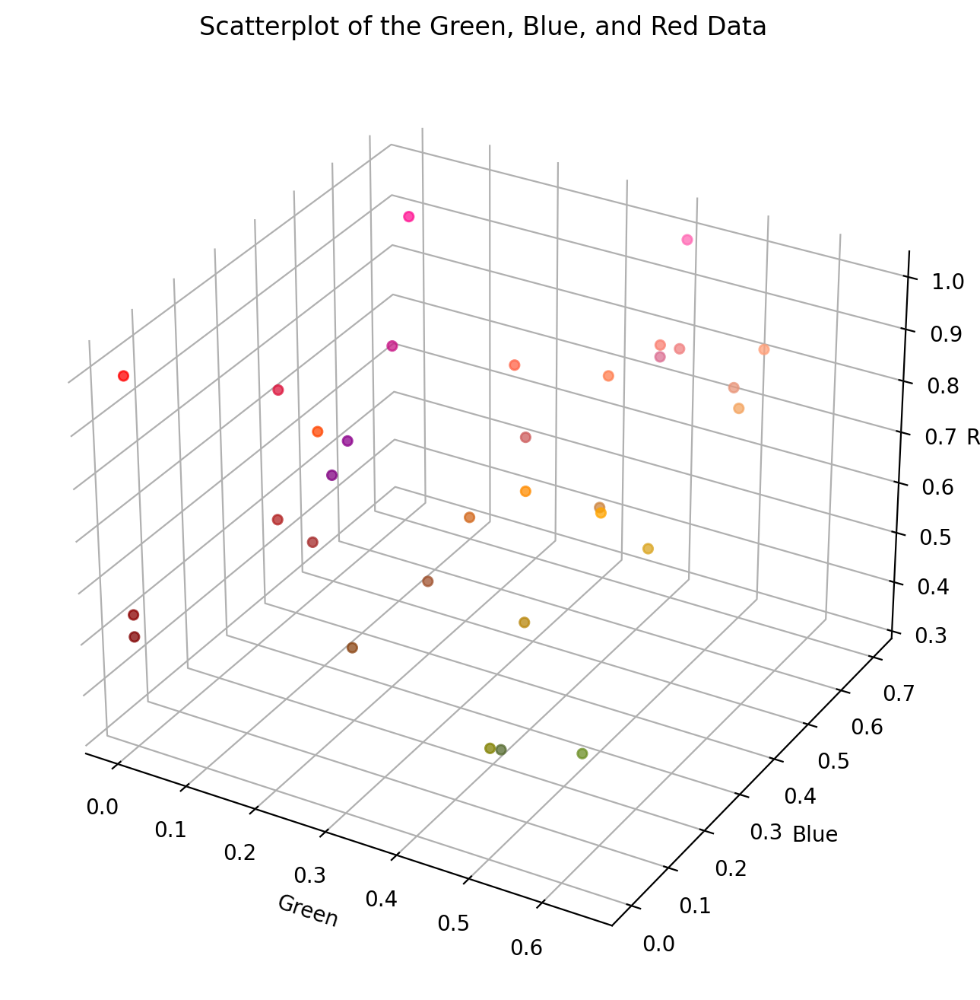

In [70]:

test_list = shu.get_color_proximity(
    distance_df=css4_distance_df, color_dict=mcolors.CSS4_COLORS, color_title='CSS4', color_str='Red'
)
test_colors_list = [t[1] for t in test_list]
f = lambda row_series: str(row_series.name).lower() in test_colors_list
mask_series = css4_colors_df.apply(f, axis='columns')
shu.show_3d_plot(css4_colors_df[mask_series])

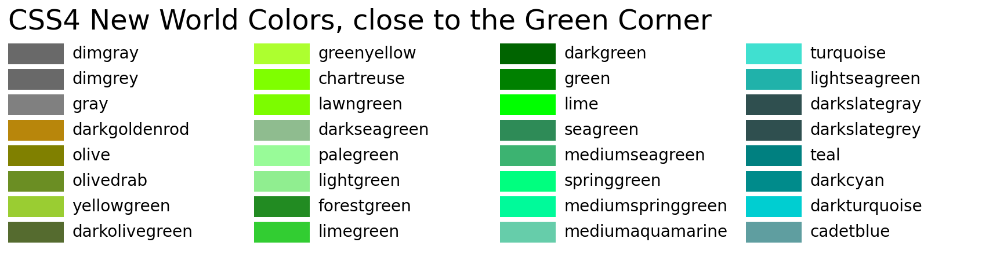

In [71]:

shu.show_color_proximity(distance_df=css4_distance_df, color_dict=mcolors.CSS4_COLORS, color_str='Green', color_title='CSS4', saeculum_title='New World', verbose=False)

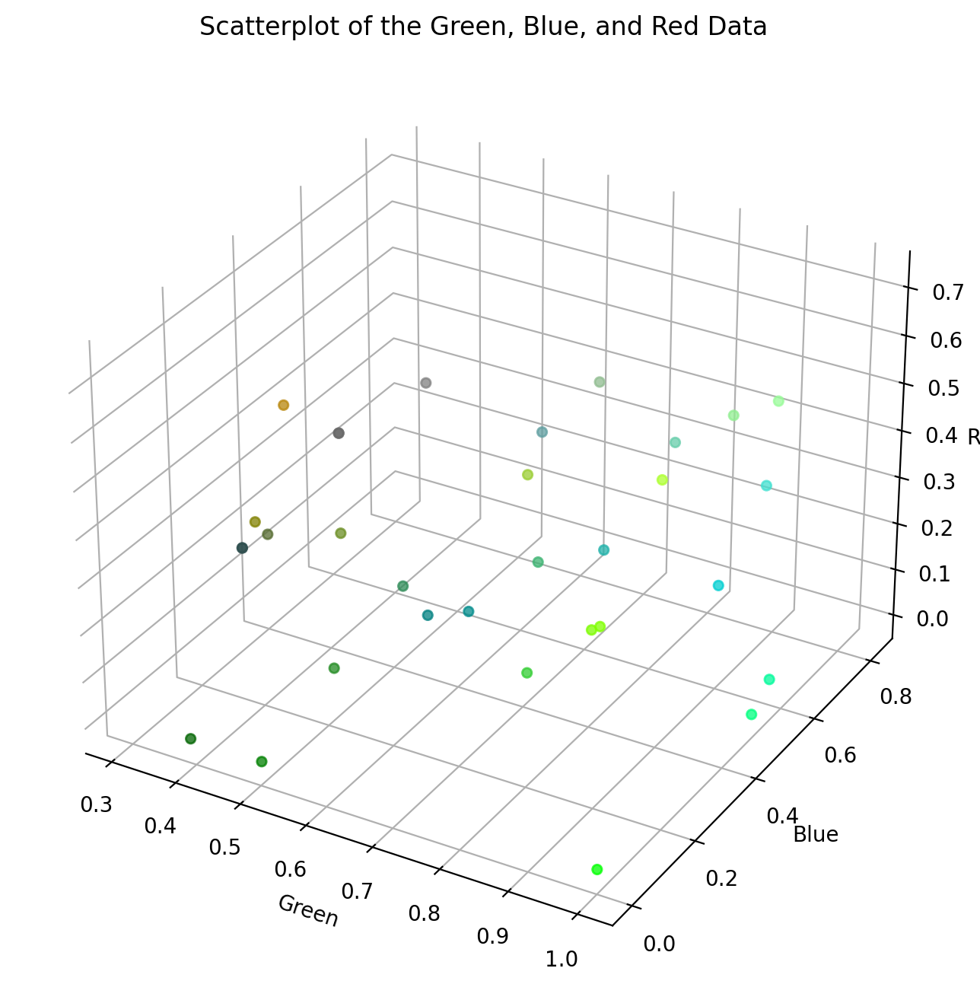

In [73]:

test_list = shu.get_color_proximity(
    distance_df=css4_distance_df, color_dict=mcolors.CSS4_COLORS, color_title='CSS4', color_str='Green'
)
test_colors_list = [t[1] for t in test_list]
f = lambda row_series: str(row_series.name).lower() in test_colors_list
mask_series = css4_colors_df.apply(f, axis='columns')
shu.show_3d_plot(css4_colors_df[mask_series])

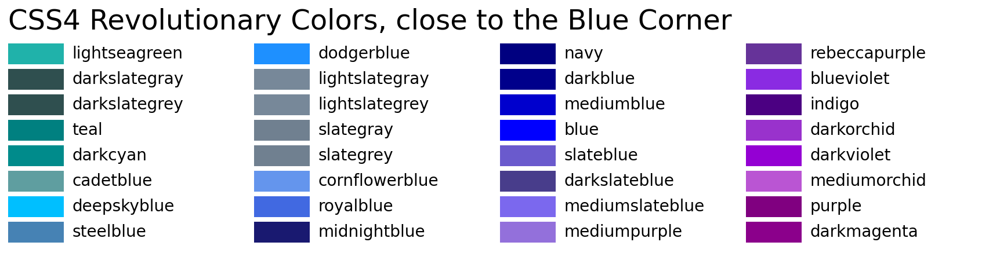

In [74]:

shu.show_color_proximity(distance_df=css4_distance_df, color_dict=mcolors.CSS4_COLORS, color_str='Blue', color_title='CSS4', saeculum_title='Revolutionary', verbose=False)

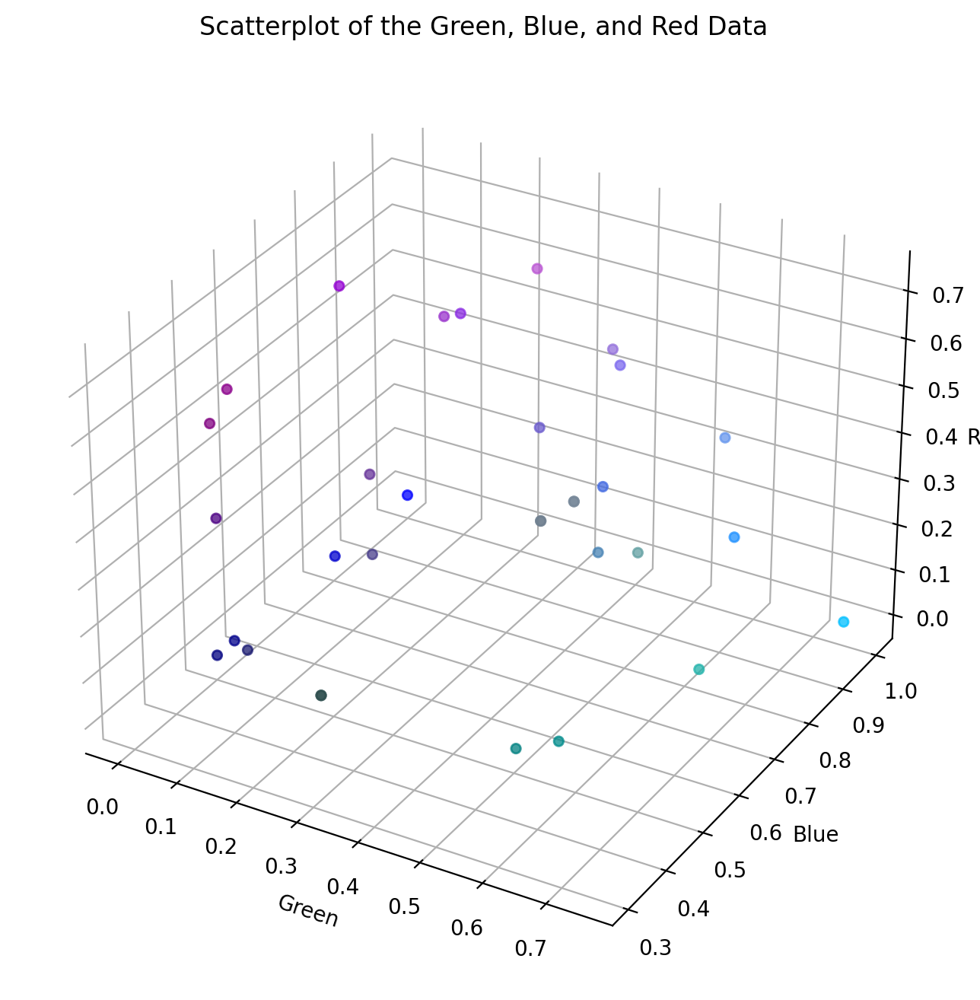

In [75]:

test_list = shu.get_color_proximity(
    distance_df=css4_distance_df, color_dict=mcolors.CSS4_COLORS, color_title='CSS4', color_str='Blue'
)
test_colors_list = [t[1] for t in test_list]
f = lambda row_series: str(row_series.name).lower() in test_colors_list
mask_series = css4_colors_df.apply(f, axis='columns')
shu.show_3d_plot(css4_colors_df[mask_series])

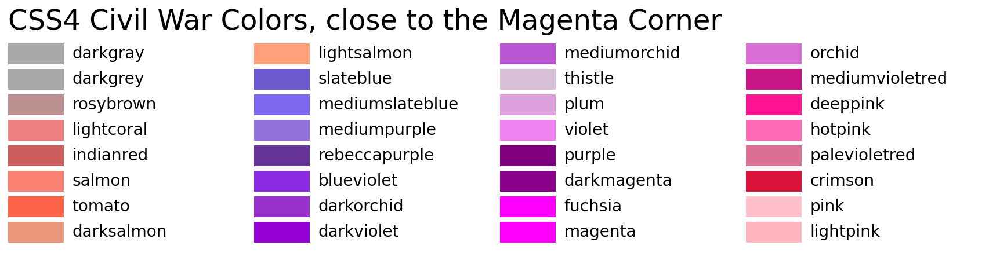

In [76]:

shu.show_color_proximity(distance_df=css4_distance_df, color_dict=mcolors.CSS4_COLORS, color_str='Magenta', color_title='CSS4', saeculum_title='Civil War', verbose=False)

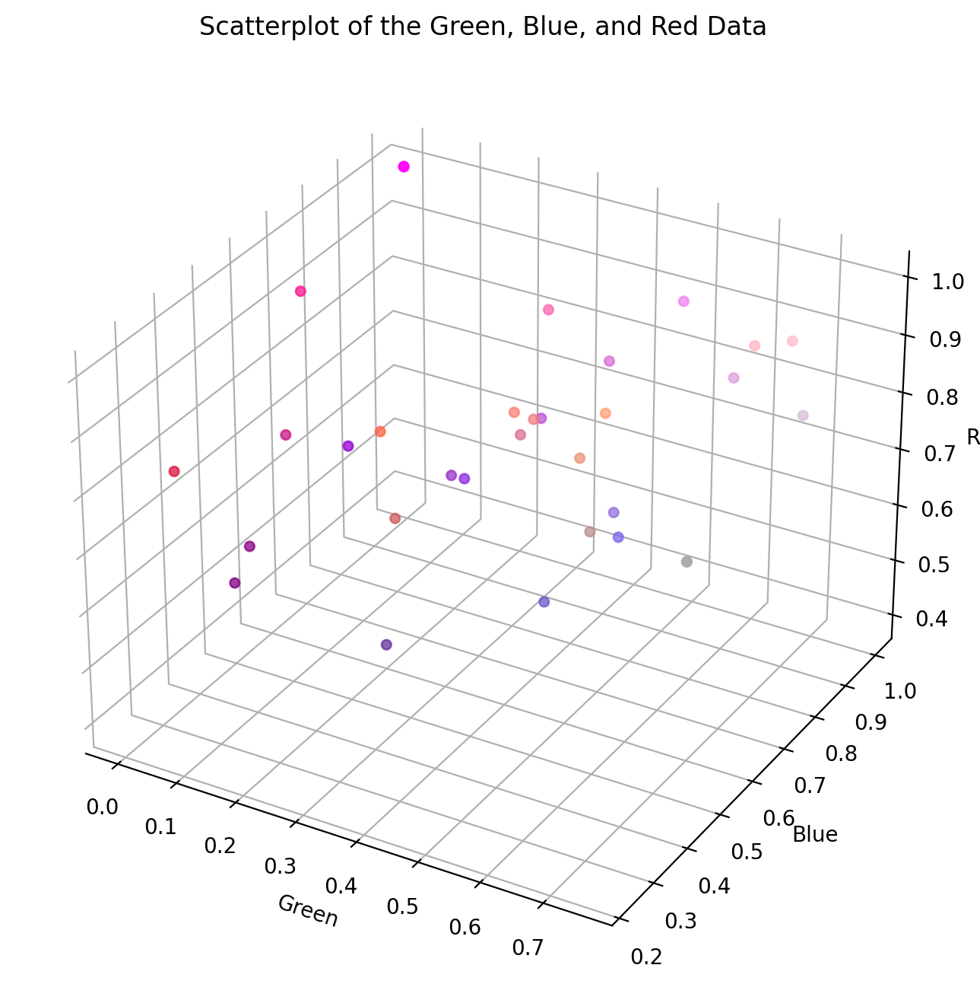

In [77]:

test_list = shu.get_color_proximity(
    distance_df=css4_distance_df, color_dict=mcolors.CSS4_COLORS, color_title='CSS4', color_str='Magenta'
)
test_colors_list = [t[1] for t in test_list]
f = lambda row_series: str(row_series.name).lower() in test_colors_list
mask_series = css4_colors_df.apply(f, axis='columns')
shu.show_3d_plot(css4_colors_df[mask_series])

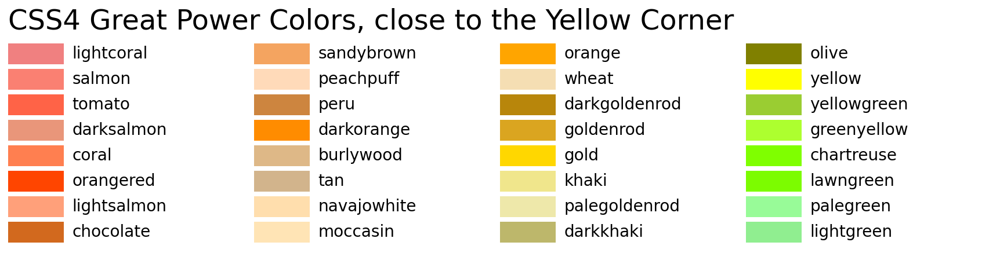

In [78]:

shu.show_color_proximity(distance_df=css4_distance_df, color_dict=mcolors.CSS4_COLORS, color_str='Yellow', color_title='CSS4', saeculum_title='Great Power', verbose=False)

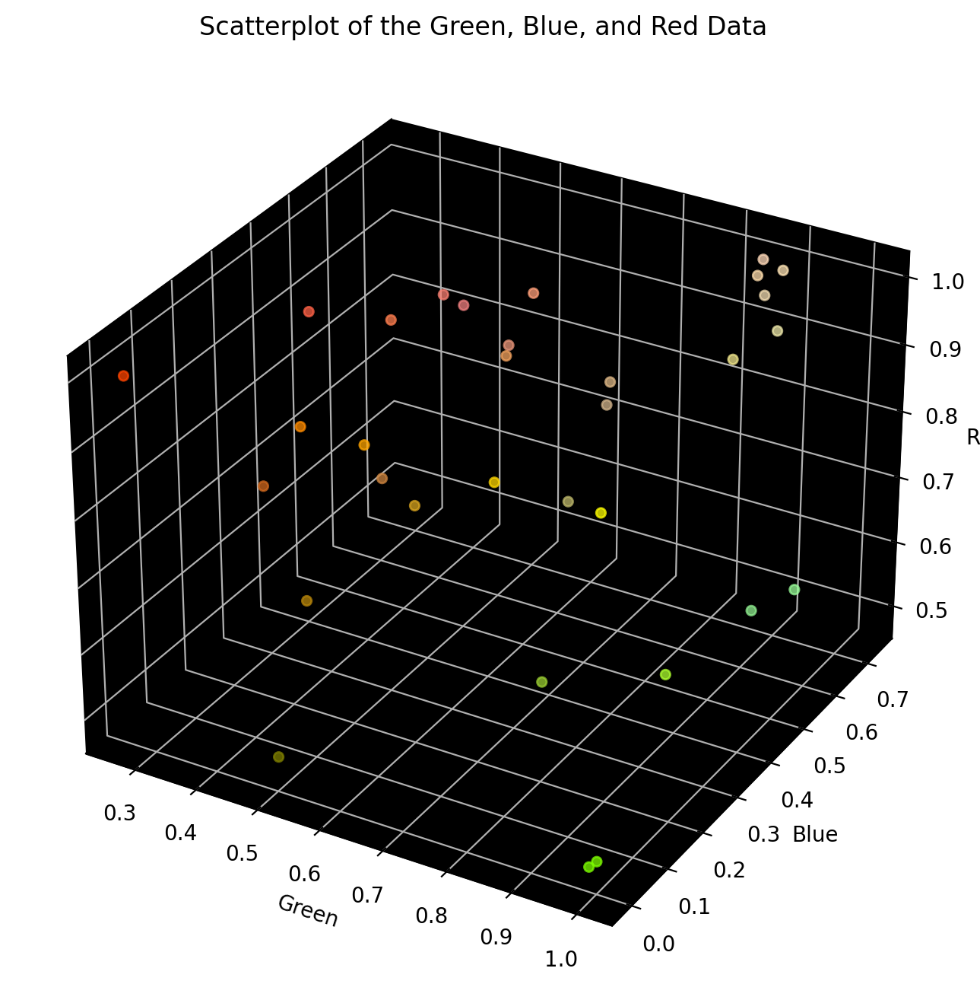

In [79]:

test_list = shu.get_color_proximity(
    distance_df=css4_distance_df, color_dict=mcolors.CSS4_COLORS, color_title='CSS4', color_str='Yellow'
)
test_colors_list = [t[1] for t in test_list]
f = lambda row_series: str(row_series.name).lower() in test_colors_list
mask_series = css4_colors_df.apply(f, axis='columns')
shu.show_3d_plot(css4_colors_df[mask_series], pane_color='black')

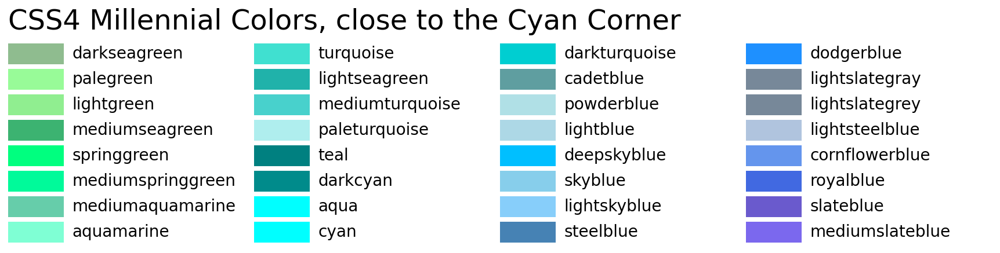

In [80]:

shu.show_color_proximity(distance_df=css4_distance_df, color_dict=mcolors.CSS4_COLORS, color_str='Cyan', color_title='CSS4', saeculum_title='Millennial', verbose=False)

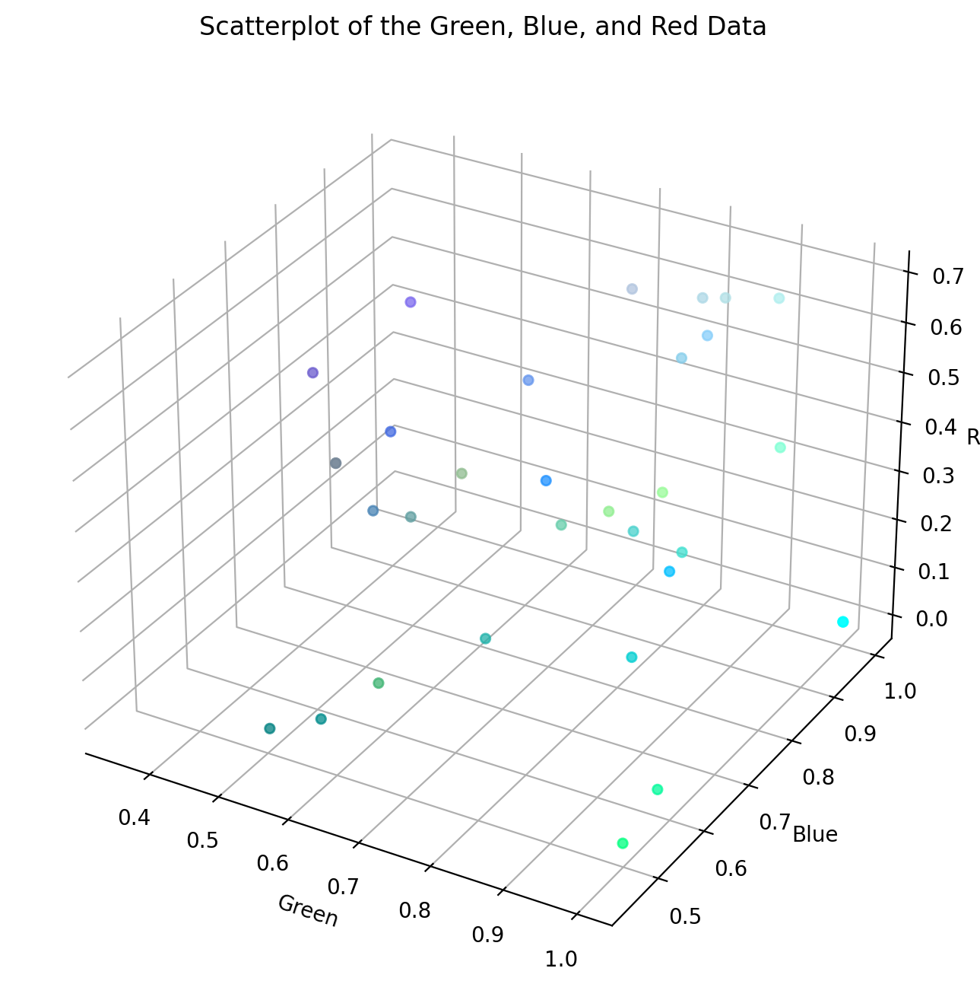

In [81]:

test_list = shu.get_color_proximity(
    distance_df=css4_distance_df, color_dict=mcolors.CSS4_COLORS, color_title='CSS4', color_str='Cyan'
)
test_colors_list = [t[1] for t in test_list]
f = lambda row_series: str(row_series.name).lower() in test_colors_list
mask_series = css4_colors_df.apply(f, axis='columns')
shu.show_3d_plot(css4_colors_df[mask_series], pane_color='white')

In [82]:

css4_kbcg_reformation_dict = {name: shu.distance_from_kbcg_face(mcolors.to_rgb(color)) for name, color in mcolors.CSS4_COLORS.items() if name in css4_reformation_list}

In [84]:

shu.plot_colortable(
    colors_dict={name: color for name, color in mcolors.CSS4_COLORS.items() if name in css4_reformation_list}, title='CSS4 Reformation Colors', sort_colors=True, emptycols=1
)

In [88]:

color_tuple_list = sorted((distance, name) for name, distance in css4_kbcg_reformation_dict.items())
test_list = color_tuple_list[:8]
saeculum_title = 'Reformation'
face_title = 'KBCG'
nearness_str = 'close to'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str, color_dict=mcolors.CSS4_COLORS, color_title='CSS4')

test_list = "[]"


In [89]:

reformation_color_list = ['mediumseagreen', 'seagreen', 'darkcyan', 'steelblue']

In [90]:

color_tuple_list = sorted((distance, name) for name, distance in css4_kbcg_reformation_dict.items())
test_list = color_tuple_list[-4:]
saeculum_title = 'Reformation'
face_title = 'KBCG'
nearness_str = 'far from'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str, color_dict=mcolors.CSS4_COLORS, color_title='CSS4')

test_list = "[]"


In [91]:

css4_krmb_new_world_dict = {name: shu.distance_from_krmb_face(mcolors.to_rgb(color)) for name,
                            color in mcolors.CSS4_COLORS.items() if name in css4_new_world_list}

In [93]:

shu.plot_colortable(
    colors_dict={name: color for name, color in mcolors.CSS4_COLORS.items() if name in css4_new_world_list}, title='CSS4 New World Colors', sort_colors=True, emptycols=1
)

In [94]:

color_tuple_list = sorted((distance, name) for name, distance in css4_krmb_new_world_dict.items())
test_list = color_tuple_list[:12]
saeculum_title = 'New World'
face_title = 'KRMB'
nearness_str = 'close to'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str, color_dict=mcolors.CSS4_COLORS, color_title='CSS4')

test_list = "[]"


In [95]:

new_world_color_list = ['brown', 'mediumblue', 'rebeccapurple', 'darkmagenta']

In [96]:

color_tuple_list = sorted((distance, name) for name, distance in css4_krmb_new_world_dict.items())
test_list = color_tuple_list[-4:]
saeculum_title = 'New World'
face_title = 'KRMB'
nearness_str = 'far from'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str, color_dict=mcolors.CSS4_COLORS, color_title='CSS4')

test_list = "[]"


In [97]:

css4_kryg_revolutionary_dict = {name: shu.distance_from_kryg_face(mcolors.to_rgb(color)) for name,
                                color in mcolors.CSS4_COLORS.items() if name in css4_revolutionary_list}

In [98]:

shu.plot_colortable(
    colors_dict={name: color for name, color in mcolors.CSS4_COLORS.items() if name in css4_revolutionary_list}, title='CSS4 Revolutionary Colors', sort_colors=True, emptycols=1
)

In [99]:

color_tuple_list = sorted((distance, name) for name, distance in css4_kryg_revolutionary_dict.items())
test_list = color_tuple_list[:12]
saeculum_title = 'Revolutionary'
face_title = 'KRYG'
nearness_str = 'close to'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str, color_dict=mcolors.CSS4_COLORS, color_title='CSS4')

test_list = "[]"


In [100]:

revolutionary_color_list = ['']

In [101]:

color_tuple_list = sorted((distance, name) for name, distance in css4_kryg_revolutionary_dict.items())
test_list = color_tuple_list[-4:]
saeculum_title = 'Revolutionary'
face_title = 'KRYG'
nearness_str = 'far from'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str, color_dict=mcolors.CSS4_COLORS, color_title='CSS4')

test_list = "[]"


In [102]:

css4_wcbm_civil_war_dict = {name: shu.distance_from_wcbm_face(mcolors.to_rgb(color)) for name, color in mcolors.CSS4_COLORS.items() if name in css4_civil_war_list}

In [103]:

shu.plot_colortable(
    colors_dict={name: color for name, color in mcolors.CSS4_COLORS.items() if name in css4_civil_war_list}, title='CSS4 Civil War Colors', sort_colors=True, emptycols=1
)

In [104]:

color_tuple_list = sorted((distance, name) for name, distance in css4_wcbm_civil_war_dict.items())
test_list = color_tuple_list[:4]
saeculum_title = 'Civil War'
face_title = 'WCBM'
nearness_str = 'close to'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str, color_dict=mcolors.CSS4_COLORS, color_title='CSS4')

test_list = "[]"


In [105]:

color_tuple_list = sorted((distance, name) for name, distance in css4_wcbm_civil_war_dict.items())
test_list = color_tuple_list[:12]
saeculum_title = 'Civil War'
face_title = 'WCBM'
nearness_str = 'close to'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str, color_dict=mcolors.CSS4_COLORS, color_title='CSS4')

test_list = "[]"


In [106]:

color_tuple_list = sorted((distance, name) for name, distance in css4_wcbm_civil_war_dict.items())
test_list = color_tuple_list[-12:]
saeculum_title = 'Civil War'
face_title = 'WCBM'
nearness_str = 'far from'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str, color_dict=mcolors.CSS4_COLORS, color_title='CSS4')

test_list = "[]"


In [107]:

css4_wcgy_great_power_dict = {name: shu.distance_from_wcgy_face(mcolors.to_rgb(color)) for name, color in mcolors.CSS4_COLORS.items() if name in css4_great_power_list}
color_tuple_list = sorted((distance, name) for name, distance in css4_wcgy_great_power_dict.items())

In [108]:

shu.plot_colortable(
    colors_dict={name: color for name, color in mcolors.CSS4_COLORS.items() if name in css4_great_power_list}, title='CSS4 Great Power Colors', sort_colors=True, emptycols=1
)

In [109]:

test_list = color_tuple_list[:4]
saeculum_title = 'Great Power'
face_title = 'WCGY'
nearness_str = 'close to'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str, color_dict=mcolors.CSS4_COLORS, color_title='CSS4')

test_list = "[]"


In [110]:

test_list = color_tuple_list[-4:]
saeculum_title = 'Great Power'
face_title = 'WCGY'
nearness_str = 'far from'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str, color_dict=mcolors.CSS4_COLORS, color_title='CSS4')

test_list = "[]"


In [111]:

css4_wyrm_millennial_dict = {name: shu.distance_from_wyrm_face(mcolors.to_rgb(color)) for name, color in mcolors.CSS4_COLORS.items() if name in css4_millennial_list}
color_tuple_list = sorted((distance, name) for name, distance in css4_wyrm_millennial_dict.items())

In [112]:

shu.plot_colortable(
    colors_dict={name: color for name, color in mcolors.CSS4_COLORS.items() if name in css4_millennial_list}, title='CSS4 Millennial Colors', sort_colors=True, emptycols=1
)

In [113]:

test_list = color_tuple_list[:4]
saeculum_title = 'Millenial'
face_title = 'WYRM'
nearness_str = 'close to'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str, color_dict=mcolors.CSS4_COLORS, color_title='CSS4')

test_list = "[]"


In [114]:

test_list = color_tuple_list[-4:]
saeculum_title = 'Millenial'
face_title = 'WYRM'
nearness_str = 'far from'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str, color_dict=mcolors.CSS4_COLORS, color_title='CSS4')

test_list = "[]"


In [115]:

test_list = color_tuple_list[:20:5]
saeculum_title = 'Millenial'
face_title = 'WYRM'
nearness_str = 'close to'
shu.display_test_colors(test_list, saeculum_title, face_title, nearness_str, color_dict=mcolors.CSS4_COLORS, color_title='CSS4')

test_list = "[]"


In [116]:

columns_list = ['saeculum_name', 'generation_name']
mask_series = (shu.patriline_df.saeculum_name == 'Reformation')
shu.patriline_df[mask_series][columns_list]

,saeculum_name,generation_name
patriarch_name,,
Thomas Bobbet,Reformation,Parliamentary
"(No Name), Jr.",Reformation,Elizabethan
"(No Name), Sr.",Reformation,Reprisal


In [118]:

if 'css4_color' not in shu.patriline_df.columns:
    shu.patriline_df['css4_color'] = np.nan

    # Millennial
    mask_series = (shu.patriline_df.index == 'Stephen Elkanah Babbitt')
    shu.patriline_df.loc[mask_series, 'css4_color'] = 'aqua'
    mask_series = (shu.patriline_df.index == 'David George Babbitt')
    shu.patriline_df.loc[mask_series, 'css4_color'] = 'darkturquoise'

    # Great Power
    mask_series = (shu.patriline_df.index == 'Joseph Robert Babbitt, Jr.')
    shu.patriline_df.loc[mask_series, 'css4_color'] = 'yellow'
    mask_series = (shu.patriline_df.index == 'Joseph Robert Babbitt, Sr.')
    shu.patriline_df.loc[mask_series, 'css4_color'] = 'gold'

    # Civil War
    mask_series = (shu.patriline_df.index == 'David William Babbitt, Jr.')
    shu.patriline_df.loc[mask_series, 'css4_color'] = 'fuchsia'
    mask_series = (shu.patriline_df.index == 'David William Babbitt, Sr.')
    shu.patriline_df.loc[mask_series, 'css4_color'] = 'darkviolet'

    # Revolutionary
    mask_series = (shu.patriline_df.index == 'William David Babbitt')
    shu.patriline_df.loc[mask_series, 'css4_color'] = 'blue'
    mask_series = (shu.patriline_df.index == 'David Babbitt')
    shu.patriline_df.loc[mask_series, 'css4_color'] = 'darkblue'
    mask_series = (shu.patriline_df.index == 'Elkanah Babbitt, IV')
    shu.patriline_df.loc[mask_series, 'css4_color'] = 'royalblue'
    mask_series = (shu.patriline_df.index == 'Elkanah Babbitt, III')
    shu.patriline_df.loc[mask_series, 'css4_color'] = 'indigo'

    # New World
    mask_series = (shu.patriline_df.index == 'Elkanah Babbitt, II')
    shu.patriline_df.loc[mask_series, 'css4_color'] = 'lime'
    mask_series = (shu.patriline_df.index == 'Elkanah Babbitt, I')
    shu.patriline_df.loc[mask_series, 'css4_color'] = 'forestgreen'
    mask_series = (shu.patriline_df.index == 'Edward Bobet')
    shu.patriline_df.loc[mask_series, 'css4_color'] = 'chartreuse'

    # Reformation
    mask_series = (shu.patriline_df.index == 'Thomas Bobbet')
    shu.patriline_df.loc[mask_series, 'css4_color'] = 'red'
    mask_series = (shu.patriline_df.index == '(No Name), Jr.')
    shu.patriline_df.loc[mask_series, 'css4_color'] = 'firebrick'
    mask_series = (shu.patriline_df.index == '(No Name), Sr.')
    shu.patriline_df.loc[mask_series, 'css4_color'] = 'tomato'
    
    s.store_objects(patriline_df=shu.patriline_df)

In [119]:

if ('xkcd_text_color' not in shu.patriline_df.columns) and ('css4_text_color' not in shu.patriline_df.columns):
    shu.patriline_df['xkcd_text_color'] = np.nan
    shu.patriline_df['css4_text_color'] = np.nan

    shu.patriline_df = shu.patriline_df.apply(shu.get_shortest_distance, axis='columns')
    store_objects(patriline_df=shu.patriline_df)

In [120]:

columns_list = ['xkcd_color', 'css4_color', 'xkcd_text_color', 'css4_text_color']
shu.patriline_df[columns_list]

,xkcd_color,css4_color,xkcd_text_color,css4_text_color
patriarch_name,,,,
Stephen Elkanah Babbitt,xkcd:cyan,aqua,black,black
David George Babbitt,xkcd:aqua blue,darkturquoise,black,black
"Joseph Robert Babbitt, Jr.",xkcd:bright yellow,yellow,black,black
"Joseph Robert Babbitt, Sr.",xkcd:dandelion,gold,black,black
"David William Babbitt, Jr.",xkcd:bright magenta,fuchsia,black,black
"David William Babbitt, Sr.",xkcd:bright purple,darkviolet,black,white
William David Babbitt,xkcd:primary blue,blue,white,white
David Babbitt,xkcd:ultramarine blue,darkblue,white,white
"Elkanah Babbitt, IV",xkcd:light royal blue,royalblue,white,black



# Base

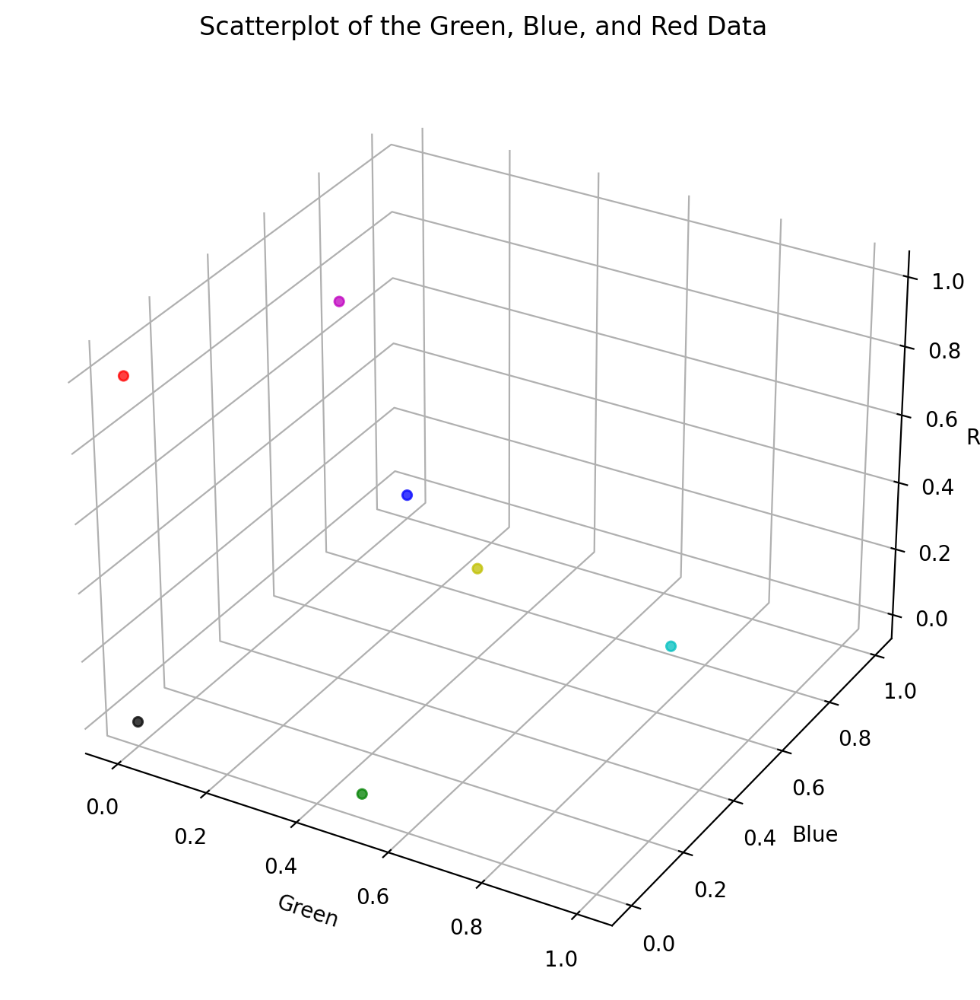

In [121]:

colors_dict = {name: mcolors.to_rgb(color) for name, color in mcolors.BASE_COLORS.items()}
base_colors_df = shu.colors_dict_to_dataframe(colors_dict)
shu.show_3d_plot(base_colors_df)

In [46]:

base_reformation_list = []
base_new_world_list = []
base_revolutionary_list = []
base_civil_war_list = []
base_great_power_list = []
base_millennial_list = []
base_distance_df = shu.get_distance_dataframe(base_colors_df, color_title='Base')
base_face_dictionary = shu.get_face_dictionary(base_distance_df)
for key, value in base_face_dictionary.items():
    if value == 'black-blue-cyan-green': base_reformation_list .append(key)
    elif value == 'black-red-magenta-blue': base_new_world_list .append(key)
    elif value == 'black-red-yellow-green': base_revolutionary_list .append(key)
    elif value == 'white-cyan-blue-magenta': base_civil_war_list .append(key)
    elif value == 'white-cyan-green-yellow': base_great_power_list .append(key)
    elif value == 'white-yellow-red-magenta': base_millennial_list .append(key)

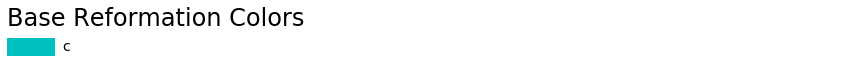

In [47]:

plot_colortable(colors_dict={name: color for name, color in mcolors.BASE_COLORS.items() if name in base_reformation_list},
                title='Base Reformation Colors', sort_colors=True, emptycols=1)

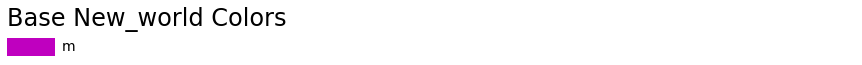

In [48]:

plot_colortable(colors_dict={name: color for name, color in mcolors.BASE_COLORS.items() if name in base_new_world_list},
                title='Base New_world Colors', sort_colors=True, emptycols=1)

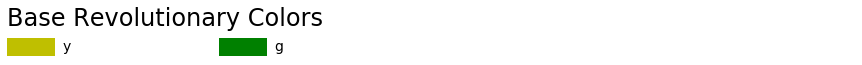

In [49]:

plot_colortable(colors_dict={name: color for name, color in mcolors.BASE_COLORS.items() if name in base_revolutionary_list},
                title='Base Revolutionary Colors', sort_colors=True, emptycols=1)

In [77]:

plot_colortable(colors_dict={name: color for name, color in mcolors.BASE_COLORS.items() if name in base_civil_war_list},
                title='Base Civil_war Colors', sort_colors=True, emptycols=1)

In [78]:

plot_colortable(colors_dict={name: color for name, color in mcolors.BASE_COLORS.items() if name in base_great_power_list},
                title='Base Great_power Colors', sort_colors=True, emptycols=1)

In [79]:

plot_colortable(colors_dict={name: color for name, color in mcolors.BASE_COLORS.items() if name in base_millennial_list},
                title='Base Millennial Colors', sort_colors=True, emptycols=1)

In [53]:

shu.show_face_proximity(base_distance_df)

b is in the blue corner
g is nearest the black-red-yellow-green face
r is in the red corner
c is nearest the black-blue-cyan-green face
m is nearest the black-red-magenta-blue face
y is nearest the black-red-yellow-green face
k is in the black corner
w is in the white corner


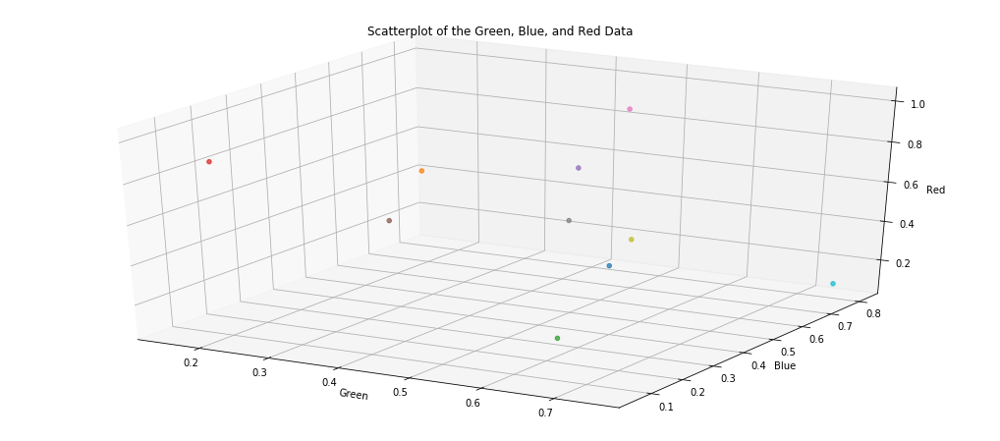

In [54]:

colors_dict = {name: mcolors.to_rgb(color) for name, color in mcolors.TABLEAU_COLORS.items()}
tab_colors_df = shu.colors_dict_to_dataframe(colors_dict)
shu.show_3d_plot(tab_colors_df)

In [55]:

tab_reformation_list = []
tab_new_world_list = []
tab_revolutionary_list = []
tab_civil_war_list = []
tab_great_power_list = []
tab_millennial_list = []
tab_distance_df = shu.get_distance_dataframe(tab_colors_df, color_title='Tableau')
tab_face_dictionary = shu.get_face_dictionary(tab_distance_df)
for key, value in tab_face_dictionary.items():
    if value == 'black-blue-cyan-green':
        tab_reformation_list .append(key)
    elif value == 'black-red-magenta-blue':
        tab_new_world_list .append(key)
    elif value == 'black-red-yellow-green':
        tab_revolutionary_list .append(key)
    elif value == 'white-cyan-blue-magenta':
        tab_civil_war_list .append(key)
    elif value == 'white-cyan-green-yellow':
        tab_great_power_list .append(key)
    elif value == 'white-yellow-red-magenta':
        tab_millennial_list .append(key)

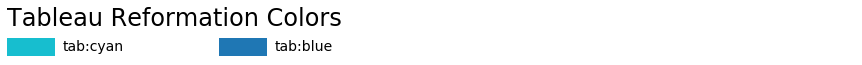

In [56]:

plot_colortable(colors_dict={name: color for name, color in mcolors.TABLEAU_COLORS.items() if name in tab_reformation_list},
                title='Tableau Reformation Colors', sort_colors=True, emptycols=1)

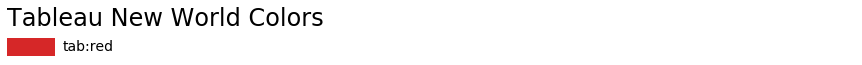

In [81]:

plot_colortable(colors_dict={name: color for name, color in mcolors.TABLEAU_COLORS.items() if name in tab_new_world_list},
                title='Tableau New World Colors', sort_colors=True, emptycols=1)

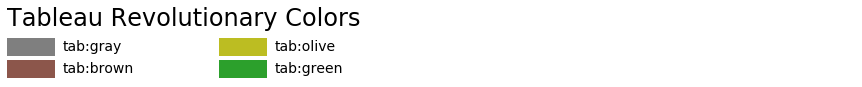

In [58]:

plot_colortable(colors_dict={name: color for name, color in mcolors.TABLEAU_COLORS.items() if name in tab_revolutionary_list},
                title='Tableau Revolutionary Colors', sort_colors=True, emptycols=1)

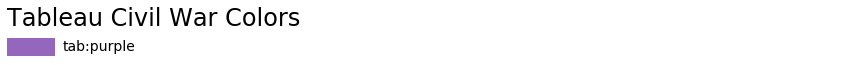

In [82]:

plot_colortable(colors_dict={name: color for name, color in mcolors.TABLEAU_COLORS.items() if name in tab_civil_war_list},
                title='Tableau Civil War Colors', sort_colors=True, emptycols=1)

In [80]:

plot_colortable(colors_dict={name: color for name, color in mcolors.TABLEAU_COLORS.items() if name in tab_great_power_list},
                title='Tableau Great Power Colors', sort_colors=True, emptycols=1)

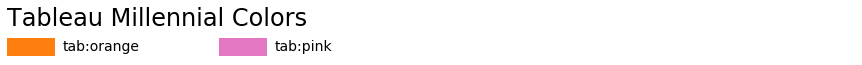

In [61]:

plot_colortable(colors_dict={name: color for name, color in mcolors.TABLEAU_COLORS.items() if name in tab_millennial_list},
                title='Tableau Millennial Colors', sort_colors=True, emptycols=1)

In [251]:

xkcd_distance_df = shu.get_distance_dataframe(xkcd_colors_df, color_title='XKCD')
css4_distance_df = shu.get_distance_dataframe(css4_colors_df, color_title='CSS4')
base_distance_df = shu.get_distance_dataframe(base_colors_df, color_title='Base')
tab_distance_df = shu.get_distance_dataframe(tab_colors_df, color_title='Tableau')

In [263]:

columns_list = ['color_title', 'shu.shu.distance_from_white', 'shu.shu.distance_from_black', 'distance_from_red', 'distance_from_green', 'distance_from_blue',
                'distance_from_magenta', 'distance_from_yellow', 'distance_from_cyan', 'shu.distance_from_kryg_face',
                'shu.distance_from_krmb_face', 'shu.distance_from_kbcg_face', 'shu.distance_from_wcgy_face', 'shu.distance_from_wcbm_face',
                'shu.distance_from_wyrm_face']
merge_df = xkcd_distance_df.merge(right=css4_distance_df, how='outer', on=columns_list, left_index=True, right_index=True,
                                  suffixes=('_xkcd', '_css4'))
merge_df = merge_df.merge(right=base_distance_df, how='outer', on=columns_list, left_index=True, right_index=True, suffixes=('_merge', '_base'))
colors_distance_df = merge_df.merge(right=tab_distance_df, how='outer', on=columns_list, left_index=True, right_index=True,
                                    suffixes=('_merge', '_tab'))
store_objects(colors_distance_df=colors_distance_df)
colors_distance_df.T.sample(8).T

Pickling to C:\Users\dev\Documents\repositories\notebooks\Strauss–Howe\saves\pickle\colors_distance_df.pickle


,distance_from_yellow,distance_from_white,distance_from_black,distance_from_green,distance_from_kbcg_face,distance_from_cyan,distance_from_wcgy_face,distance_from_wyrm_face
aliceblue,1.0021,0.0649135,1.68276,1.37352,1.16581,0.941577,0.667376,0.69048
antiquewhite,0.847004,0.176471,1.58787,1.29545,1.121,0.995955,0.595543,0.543919
aqua,1.41421,1,1.41421,1,0.707107,0,0.707107,1.22474
aquamarine,0.971156,0.529528,1.39256,0.969135,0.779648,0.525812,0.331378,0.782159
azure,1.00173,0.0588235,1.69877,1.37325,1.17721,0.941176,0.666811,0.709549
...,...,...,...,...,...,...,...,...
xkcd:yellowy brown,0.556821,1.10269,0.874615,0.821435,0.820241,1.25723,0.667341,0.555058
xkcd:yellowy green,0.301017,0.881411,1.21608,0.767236,0.936422,1.12913,0.427514,0.615505
y,0.353553,1.06066,1.06066,0.790569,0.935414,1.27475,0.612372,0.612372
yellow,0,1,1.41421,1,1.22474,1.41421,0.707107,0.707107


In [264]:

colors_distance_df.color_title.unique()

array(['CSS4', 'Base', 'Tableau', 'XKCD'], dtype=object)

In [269]:

mask_series = (colors_distance_df.color_title == 'CSS4')
css4_set = set(colors_distance_df[mask_series].index.tolist())
print(css4_set)
mask_series = (colors_distance_df.color_title == 'Tableau')
tab_set = set(colors_distance_df[mask_series].index.tolist())
print(tab_set)
tab_set.intersection(css4_set)

{'dimgray', 'lightgrey', 'navy', 'thistle', 'chocolate', 'lightslategrey', 'crimson', 'moccasin', 'springgreen', 'palegoldenrod', 'lightgray', 'olivedrab', 'darkturquoise', 'pink', 'saddlebrown', 'deepskyblue', 'chartreuse', 'whitesmoke', 'honeydew', 'khaki', 'aquamarine', 'burlywood', 'lightseagreen', 'palegreen', 'darkkhaki', 'mediumblue', 'slategrey', 'lemonchiffon', 'white', 'mediumslateblue', 'dodgerblue', 'darkmagenta', 'steelblue', 'floralwhite', 'darkorange', 'cadetblue', 'lightslategray', 'royalblue', 'powderblue', 'limegreen', 'slategray', 'linen', 'cyan', 'mediumspringgreen', 'lightskyblue', 'firebrick', 'seagreen', 'sandybrown', 'antiquewhite', 'lightyellow', 'blueviolet', 'snow', 'lightsteelblue', 'skyblue', 'gray', 'maroon', 'red', 'rebeccapurple', 'tan', 'orangered', 'tomato', 'indianred', 'midnightblue', 'darkseagreen', 'lavenderblush', 'palevioletred', 'peru', 'lightgreen', 'papayawhip', 'navajowhite', 'forestgreen', 'darkslategrey', 'cornsilk', 'blue', 'aliceblue', 'g

set()

In [272]:

shu.patriline_df.columns = ['year_of_birth', 'year_of_death', 'generation_name', 'date_of_birth', 'place_of_birth', 'birth_longitude', 'birth_latitude', 'date_of_death',
                        'place_of_death', 'death_longitude', 'death_latitude', 'saeculum_name']
store_objects(shu.patriline_df=shu.patriline_df)

Pickling to C:\Users\dev\Documents\repositories\notebooks\Strauss–Howe\saves\pickle\patriline_df.pickle


In [283]:

columns_list = ['saeculum_name', 'generation_name']
patriline_groupby = shu.patriline_df.groupby(columns_list, sort=False)
print([fn for fn in dir(patriline_groupby) if ('sort' in fn.lower()) or ('order' in fn.lower())])
patriline_groupby.year_of_birth.count()
shu.patriline_df[columns_list]
store_objects(shu.patriline_df=shu.patriline_df)

['_set_result_index_ordered']


,saeculum_name,generation_name
patriarch_name,,
Stephen Elkanah Babbitt,Millennial,Millennial
David George Babbitt,Millennial,13th
"Joseph Robert Babbitt, Jr.",Great Power,Silent
"Joseph Robert Babbitt, Sr.",Great Power,Lost
"David William Babbitt, Jr.",Civil War,Progressive
"David William Babbitt, Sr.",Civil War,Transcendental
William David Babbitt,Revolutionary,Compromise
David Babbitt,Revolutionary,Republican
"Elkanah Babbitt, IV",Revolutionary,Liberty


In [270]:

shu.generations_df.columns

Index(['childhood_turning_entered', 'saeculum_name', 'turnings_archetype',
       'generations_archetype', 'birth_year_begin', 'birth_year_end',
       'childhood_turning_description', 'turning_year_begin',
       'turning_year_end'],
      dtype='object')

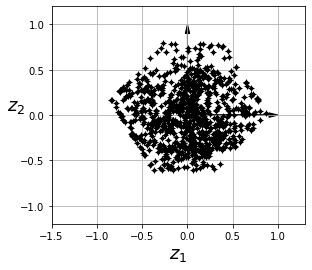

In [73]:

X = xkcd_colors_df.values
X2D = PCA(n_components=2).fit_transform(X)
fig = plt.figure()
ax = fig.add_subplot(111, aspect='equal')

ax.plot(X2D[:, 0], X2D[:, 1], 'k+')
ax.plot(X2D[:, 0], X2D[:, 1], 'k.')
ax.plot([0], [0], 'ko')
ax.arrow(0, 0, 0, 1, head_width=0.05, length_includes_head=True, head_length=0.1, fc='k', ec='k')
ax.arrow(0, 0, 1, 0, head_width=0.05, length_includes_head=True, head_length=0.1, fc='k', ec='k')
ax.set_xlabel('$z_1$', fontsize=18)
ax.set_ylabel('$z_2$', fontsize=18, rotation=0)
ax.axis([-1.5, 1.3, -1.2, 1.2])
ax.grid(True)

In [ ]:

eps = 0.09
min_samples = 1
db = DBSCAN(eps=eps, min_samples=min_samples).fit(X2D)
labels_ndarray = db.labels_
unique_labels = np.unique(labels_ndarray)
unique_labels_count = len(unique_labels)
if (unique_labels_count > 4) and (unique_labels_count < 8):
    print('np.unique(DBSCAN(eps={}, min_samples={}).fit(pca_ndarray).labels_) = {}'.format(eps, min_samples, unique_labels))

In [ ]:

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, autoscale_on=True)
cmap = plt.get_cmap('viridis_r')
path_collection = ax.scatter(X2D[:, 0], X2D[:, 1],
                             c=labels_ndarray, edgecolors=(0, 0, 0), cmap=cmap)
title_text = 'Dimension Reduced Scatterplot of the XKCD Colors'
text = plt.title(title_text)
xticklabel_obj = plt.xticks([])
yticklabel_obj = plt.yticks([])

In [ ]:

# Optionally plot the XKCD colors (Caution: will produce large figure)
file_name = 'XKCD_Colors.png'
png_folder = os.path.join(SAVES_FOLDER, 'png')
file_path = os.path.join(png_folder, file_name)
xkcd_fig = plot_colortable(mcolors.XKCD_COLORS, "XKCD Colors")
xkcd_fig.savefig(file_path)